# Final Capstone Project at Neue Fische GmbH by Christian Robledo

![title](https://cdnuploads.aa.com.tr/uploads/Contents/2017/03/13/thumbs_b_c_919380a969cf7427774545cf4b641472.jpg?v=173523)


# Predicting the functionality of water points in Tanzania 
---

## Abstract

## Methodology

## Results

# Notebook Set-Up and Import of the Data

In [6]:
#Imports
##General
import pandas as pd
import numpy as np
import math
##Visualizations
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
# Plotly
import plotly
import plotly.express as px
import plotly.graph_objects as go
import cufflinks as cf


## Dashboard

In [2]:
# Dashboard for simplification
pd.set_option('display.max_columns', 50)

## Helper Functions

In [1]:
# Some helper functions for preprocessing
to_drop = []

# just a little auxillary function for appending our to_drop list
def drop_feat(feat):
    if type(feat)==str:
        to_drop.append(feat)
    if type(feat)==list:
        to_drop.extend(feat)

def update_regions(data):
    #The location data for this set is pretty unreliable
    #I've updated the regions/discticts in the data based on the names of the wards in which the observations were located
    #These were often unique, esppecially within regions, so I've relatively certain that these are acurate
    #I didn't fix spellings thus far
   

    #Add simiyu, geita, katavi, njombe regions
    ##Simiyu
    simiyu_index = data[(data['region'] == 'Shinyanga') & (data['lga'].isin(["Maswa","Meatu","Bariadi"]))].index
    data.loc[simiyu_index, 'region']  = "Simiyu"
    ##Geita
    geita_index = data[(data['region'].isin(["Shinyanga", "Mwanza", 'Kagera'])) & (data['lga'].isin(["Bukombe", "Chato", "Geita"]))].index
    data.loc[geita_index, 'region'] = 'Geita'
    ##Katavi
    katavi_index = data[(data['region'] == "Rukwa") & (data['lga'] == "Mpanda")].index
    data.loc[katavi_index, 'region'] = 'Katavi'
    data.loc[katavi_index, 'lga'] = 'Mpanda Rural'
    ##Njombe
    njombe_index = data[(data['region'] == 'Iringa') & (data['lga'].isin(["Ludewa", "Njombe", "Makete"]))].index
    data.loc[njombe_index, 'region'] = "Njombe"

    #Fixing Mislabeled Regions/LGAS/Wards
    ##Creating the "Nyang'hwale" LGA in the Geita region
    nyang_index = data[(data['region'] == 'Geita') & (data['ward'].isin(["Nyang'hwale", 'Busolwa', 'Bukwimba', 'Mwingiro','Nyugwa','Kakora', 'Kharumwa','Shabaka','Kafita']))].index
    data.loc[nyang_index, 'lga'] = "Nyang'hwale"

    ##Creating Chemba District in Kidodoma
    chemba_index = data[(data['region'] == 'Dodoma') & (data['lga'] == 'Kondoa') & (data['ward'].isin(['Farkwa','Kwamtoro', 'Dalai', 'Chandama', 'Lalta', 'Chemba', 'Sanzawa', 'Jangalo','Goima', 'Mrijo', 'Mondo', 'Mpendo','Ovada','Makorongo']))].index
    data.loc[chemba_index, 'lga'] = 'Chemba'

    ##Creating the Gairo district in Morogoro
    gairo_index = data[(data['region'] == 'Morogoro') & (data['lga'] == 'Kilosa') & (data['ward'].isin(['Chakwale', 'Rubeho', 'Kibedya', 'Iyogwe',  'Gairo', ]))].index
    data.loc[gairo_index, 'lga'] = "Gairo"

    #Changin wards in Linidi dicstrict from rural to urban where necessary
    lindi_index = data[(data['region'] == "Lindi") & (data['lga'] == "Lindi Rural") & (data['ward'].isin(['Tandangongoro', 'Chikonji', "Ng'apa", 'Mngoyo', 'Mbanja']))].index
    data.loc[lindi_index, 'lga'] = "Lindi Urban"

    #Moving from Songea Rural to Songea Urban (Ruvuma district)
    songea_index = data[(data['region'] == 'Ruvuma') & (data['lga'] == 'Songea Rural') & (data['ward'].isin(['Lilambo', 'Tanga']))].index
    data.loc[songea_index, 'lga'] = 'Songea Urban'

    #Creating Nyasa lga in Ruvuma district
    nyasa_index = data[(data['region'] == 'Ruvuma') & (data['lga'] == 'Mbinga') & (data['ward'].isin(['Lipingo', 'Liuli', 'Tingi', 'Chiwanda', 'Kingerikiti', 'Lituhi', 'Mbaha', 'Kihagara', 'Kilosa', 'Mtipwili', 'Mbamba bay']))].index
    data.loc[nyasa_index, 'lga'] = 'Nyasa'

    #Moving Katumba to Kyela from Rungwe
    katumba_index = data[(data['region'] == 'Mbeya') & (data['ward'] == 'Katumba')].index
    data.loc[katumba_index, 'lga'] = 'Kyela'

    #Creating the Mkalama district (split from Iramba in Singida in 2010) and the Ikungi (Split from Singida Rural in 2010)
    mkalama_index = data[(data['region'] == "Singida") & (data['lga'] == 'Iramba') & (data['ward'].isin(['Nduguti', 'Msingi', 'Nkinto', 'Mpambala', 'Kinyagiri', 'Mwanga', 'Gumanga', 'Ilunda', 'Ibaga', 'Iguguno']))].index
    data.loc[mkalama_index, 'lga'] = 'Mkalama'
    ikungi_index =  data[(data['region'] == "Singida") & (data['lga'] == 'Singida Rural') & (data['ward'].isin(['Ihanja', 'Irisya', 'Mgungira', 'Misughaa', 'Minyughe', 'Puma', 'Ntuntu', 'Ikungu', 'Siuyu', "Mang'onyi", "Dung'unyi", 'Sepuko', 'Mwaru', "Munga'a", 'Issuwa']))].index
    data.loc[ikungi_index, 'lga'] = 'Ikungi'

    #Creating Kaliua district in tabora region
    kaliua_index = data[(data['region'] == 'Tabora') & (data['lga'] == 'Urambo') & (data['ward'].isin(['Ugunga', 'Igalala', 'Kanindo', 'Ushokola', 'Mwongozo', 'Igombe Mkulu', 'Kaliua', 'Ukumbisiganga', 'Kazaroho', 'Uyowa', 'Ichemba', 'Milambo', 'Usinge', 'Kashishi']))].index
    data.loc[kaliua_index, 'lga'] = 'Kaliua'

    #Creating the Kalambo district in the Rukwa region
    kalambo_index = data[(data['region'] == 'Rukwa') & (data['lga'] == 'Sumbawanga Rural') & (data['ward'].isin(['Mkowe', 'Mambwekenya', 'Katazi', 'Legezamwendo', 'Mwimbi', 'Msanzi', 'Matai', 'Sopa', 'Mwazye', 'Kasanga', 'Mambwenkoswe']))].index
    data.loc[kalambo_index, 'lga'] = 'Kalambo'

    #Creating the additional discticts in the Kigoma region
    kakonko_index = data[(data['region']=='Kigoma') & (data['lga'] == 'Kibondo') & (data['ward'].isin(['Muhange', 'Kasanda', 'Mugunzu', 'Kakonko', 'Rugenge', 'Gwanumpu', 'Nyabibuye', 'Nyamtukuza', 'Kasuga']))].index
    data.loc[kakonko_index, 'lga'] = 'Kakonko'
    kusulu_index = data[(data['region'] == 'Kigoma') & (data['lga'] == 'Kasulu') & (data['ward'].isin(['Msambara', 'Ruhita', 'Murufiti', 'Muhunga', 'Kigondo']))].index
    data.loc[kusulu_index, 'lga'] = 'Kusulu Town'
    buhigwe_index = data[(data['region'] == 'Kigoma') & (data['lga'] == 'Kasulu') & (data['ward'].isin(['Munyegera', 'Buhigwe', 'Rusaba', 'Muhinda', 'Munzenze', 'Janda', 'Kilelema', 'Muyama']))].index
    data.loc[buhigwe_index, 'lga'] = 'Buhigwe'
    uvinza_index = data[(data['region'] == 'Kigoma') & (data['lga'] == 'Kigoma Rural') & (data['ward'].isin(['Sunuka', 'Mtego wa Noti', 'Mganza', 'Kandaga', 'Uvinza', 'Ilagala', 'Nguruka', 'Simbo']))].index
    data.loc[uvinza_index, 'lga'] = 'Uvinza'

    #Creating Kahama Town in Shinyanga
    kahama_index = data[(data['region'] == 'Shinyanga') & (data['lga'] == 'Kahama') & (data['ward'].isin(['Isagehe', 'Mhongolo', 'Kinaga', 'Kahama Urban', 'Zongomera', 'Kilago', 'Malunga', 'Ngongwa', 'Nyandekwa', 'Mwendakulima']))].index
    data.loc[kahama_index, 'lga'] = 'Kahama Town'

    #Creating Kyerwa in Kagera
    kyewra_index = data[(data['region'] == 'Kagera') & (data['lga'] == 'Karagwe') & (data['ward'].isin(['Kyerwa', 'Kaisho', 'Isingiro', 'Kamuli', 'Nkwenda', 'Murongo', 'Bugomora', 'Kibingo', 'Mabira', 'Kimuli']))].index
    data.loc[kyewra_index, 'lga'] = 'Kyerwa'

    #Moving Mwzana obs to simiyu
    busega_index = data[(data['region'] == 'Mwanza') & (data['lga'] == 'Magu') & (data['ward'].isin(['Kabita', 'Badugu', 'Mwananyili', 'Mkula', 'Nyaluhande', 'Kalemela', 'Malili', 'Shigala', 'Kiloleli', 'Ngasamo', 'Igalukilo']))].index
    data.loc[busega_index, 'lga'] = 'Busega'
    data.loc[busega_index, 'region'] = 'Simiyu'

    #Moving obs to Nyamagana in Mwzana
    nyama_index = data[(data['region'] == "Mwanza") & (data['ward'].isin(['Mkolani', 'Butimba', 'Buhongwa']))].index
    data.loc[nyama_index, 'lga'] = 'Nyamagana'

    #Updating values from Tarime to Rorya
    rorya_index = data[(data['region'] == 'Mara') & (data['lga'] == 'Tarime') & (data['ward'].isin(['Goribe', 'Bukura','Roche','Tai']))].index
    data.loc[rorya_index, 'lga'] = 'Rorya'

    #Creating Musoma Urban and Butaima In Mara
    #musoma_index = data[(data['region'] == 'Mara') & (data['lga'] == 'Musoma Rural') & (data['ward'].isin([]))].index
    #data.loc[musoma_index, 'lga'] = 'Musoma Urban'
    butiama_index = data[(data['region'] == 'Mara') & (data['lga'] == 'Musoma Rural') & (data['ward'].isin(['Buswahili', 'Nyamimange', 'Etaro', 'Masaba', 'Buhemba', 'Kyanyari', 'Nyankanga', 'Nyakatende', 'Muriaza', 'Butiama', 'Buruma', 'Bukabwa', 'Bwiregi', 'Kukirango', 'Butuguri', 'Buswahili']))].index
    data.loc[butiama_index, 'lga'] = 'Butiama'

    #Creating the LGAs in njombe
    Njombe_urban_index = data[(data['region'] == 'Njombe') & (data['lga'] == 'Njombe') & (data['ward'].isin(['Idamba', 'Ikondo', 'Lupembe', 'Mtwango', 'Kidegembye', 'Igongolo']))].index
    data.loc[Njombe_urban_index, 'lga'] = 'Njombe Urban'
    wang_index = data[(data['region'] == 'Njombe') & (data['lga'] == 'Njombe') & (data['ward'].isin(['Ilembula', 'Imalinyi', 'Mdandu', 'Usuka', 'Saja', "Wanging'ombe", 'Igosi', 'Wangama', 'Luduga']))].index
    data.loc[wang_index, 'lga'] = "Wanging'ombe"
    maka_index = data[(data['region'] == 'Njombe') & (data['lga'] == 'Njombe') & (data['ward'].isin(['Mahongole', 'Makambako']))].index
    data.loc[maka_index, 'lga'] = 'Makambako'
    Njombe_rural_index = data[(data['region'] == 'Njombe') & (data['lga'] == 'Njombe') & (data['ward'].isin(['Usuka', 'Matola', 'Ikuka','Uwemba', 'Kifanya', 'Luponde', 'Njombe Urban', 'Iwungilo', 'Yakobi']))].index
    data.loc[Njombe_rural_index, 'lga'] = 'Njombe Rural'

    #Adding LGAs to Katavi
    mp_urb_index = data[(data['region'] == 'Katavi') & (data['lga'] == 'Mpanda Rural') & (data['ward'].isin(['Mishamo', 'Mpanda Ndogo', 'Mwese', 'Karema', 'Ikola', 'Katuma', 'Kabungu']))].index
    data.loc[mp_urb_index, 'lga'] = 'Mpanda Urban'
    mlele_index = data[(data['region'] == 'Katavi') & (data['lga'] == 'Mpanda Rural') & (data['ward'].isin(['Ugala', 'Mtapenda', 'Kibaoni', 'Mbede', 'Utende', 'Ilela', 'Mamba', 'Usevya', 'Kasokola', 'Nsimbo', 'Inyonga', 'Sitalike', 'Magamba', 'Machimboni', 'Ilunde',  'Urwira']))].index
    data.loc[mlele_index, 'lga'] = 'Mlele'

    #Adding Itilima in Simiyu
    itilima_index = data[(data['region'] == 'Simiyu') & (data['lga'] == 'Bariadi') & (data['ward'].isin(['Lagangabilili', 'Mbita', 'Mwaswale', 'Lugulu', "Kinang'weli", 'Sagata', 'Chinamili', 'Nkoma', 'Bumera', 'Mwamapalala', 'Mhunze', 'Zagayu']))].index
    data.loc[itilima_index, 'lga'] = 'Itilima'

    #Adding Mbongwe in geita
    mbongwe_index = data[(data['region'] == 'Geita') & (data['lga'] == 'Bukombe') & (data['ward'].isin(['Mbogwe', 'Ushirika', 'Masumbwe', 'Nyasato', 'Lugunga', 'Ilolangulu', 'Ikunguigazi', 'Iponya']))].index
    data.loc[mbongwe_index, 'lga'] = 'Mbongwe'


def location_nans(data, feature_lst):
 
    for feat in feature_lst:
        data[feat].replace(0, np.nan, inplace=True)
        data[feat].fillna(data.groupby('subvillage')[feat].transform("median"), inplace=True)
        data[feat].fillna(data.groupby('ward')[feat].transform("median"), inplace=True)
        data[feat].fillna(data.groupby('lga')[feat].transform("median"), inplace=True)
        data[feat].fillna(data.groupby(['region','district_code'])[feat].transform("mean"), inplace=True)
        data[feat].fillna(data.groupby('region')[feat].transform("mean"), inplace=True)
        data[feat].fillna(data.groupby('basin')[feat].transform("mean"), inplace=True)            
        print(feat,': missing values: ',data[feat].isna().sum())
        
    return data
            

#Lat and Long
def fill_lat_long(data, long_flag, lat_flag):
 
    means_lat = data[data['latitude'] < -0.001]['latitude'].groupby(data['region']).mean()
    means_long = data[data['longitude'] > 0]['longitude'].groupby(data['region']).mean()

    for i in range(data.shape[0]):
        region = data['region'][i]
        if data.loc[i, 'latitude'] == lat_flag:
            data.loc[i, 'latitude'] = means_lat[region]

        if data.loc[i, 'longitude'] == long_flag:
            data.loc[i, 'longitude'] = means_long[region]
  

## Glossary
**Description of every Feature**

| Feature  	| Description 	| Type 	|  	|
|:-:	|:-:	|:-:	|:-:	|
| id  	| The ID is a unique identifier for each waterpoint 	| Numerical 	|  	|
| amount_tsh [ft] 	| Total static head (amount of water availabe to waterpoint) 	| Numerical 	|  	|
| date_recorded  	| Corresponds to the date of the last inspection of each waterpoint and represents the date the row was entered 	| Object/Datetime 	|  	|
| funder  	| Funder of the well (Country/Organization/Bank) 	| Object/Categorical 	|  	|
| gps_height [ft] 	| Altitude of the well 	| Numerical 	|  	|
| installer 	| Organization that installed the well  	| Object/Categorical 	|  	|
| longitude 	| GPS coordinate 	| Numerical 	|  	|
| latitude 	| GPS coordinate 	| Numerical 	|  	|
| wpt_name 	| Name of the waterpoint if there is one 	| Object/Categorical 	|  	|
| num_private 	| No description 	| Numerical 	|  	|
| basin 	| Geographic water basin in which the well is located 	| Object/Categorical 	|  	|
| subvillage 	| Name of Subvillage 	| Object/Categorical 	|  	|
| region 	| Name of Region  	| Object/Categorical 	|  	|
| region_code 	| Code of the Region 	| Numerical/Categorical 	|  	|
| district_code 	| Code of the district 	| Numerical/Categorical 	|  	|
| lga 	| Represents districts (local government authority) belonging to each regions 	| Object/Categorical 	|  	|
| ward 	| Represents the wards of each district (lga) 	| Object/Categorical 	|  	|
| population 	| Population around the well 	| Numerical 	|  	|
| public_meeting 	| True or False 	| Boolean 	|  	|
| recorded_by 	| The organization which included the waterpoint to the dataset 	| Object/Categorical 	|  	|
| scheme_management 	| Operator of the waterpoint 	| Object/Categorical 	|  	|
| scheme_name 	| Operator of the waterpoint 	| Object/Waterpoint 	|  	|
| permit 	| Is the waterpoint permitted? True or False 	| Boolean 	|  	|
| construction_year 	| Year in which the well was constructed 	| Numerical 	|  	|
| extraction_type 	| Specifies how the water is extracted 	| Object/Categorical 	|  	|
| extraction_type_group 	| Specifies how the water is extracted 	| Object/Categorical 	|  	|
| extraction_type_class 	| Specifies how the water is extracted 	| Object/Categorical 	|  	|
| management 	| How the waterpoint is managed 	| Object/Categorical 	|  	|
| management_group 	| How the waterpoint is managed 	| Object/Categorical 	|  	|
| payment 	| Payment type / method of the well users 	| Object/Categorical 	|  	|
| payment_type 	| Payment type / method of the well users 	| Object/Categorical 	|  	|
| water_quality 	| Description of water quality 	| Object/Categorical 	|  	|
| quality_group 	| Description of water quality 	| Object/Categorical 	|  	|
| quantity 	| Description of water quantity 	| Object/Categorical 	|  	|
| quantity_group 	| Description of water quantity 	| Object/Categorical 	|  	|
| source 	| Source of the Water  	| Object/Categorical 	|  	|
| source_type 	| Source of the Water 	| Object/Categorical 	|  	|
| source_class 	| Source of the Water 	| Object/Categorical 	|  	|
| waterpoint_type 	| The kind of waterpoint 	| Object/Categorical 	|  	|
| waterpoint_type_group 	| The kind of waterpoint 	| Object/Categorical 	|  	|

## Data

**Purpose: Gather and scrape the data necessary for the project**


The data used for this analysis is provided by Drivendata.org and consists of three csv files:

* training_set_values.csv: This csv-File contains the features used for building machine learning models. So these are all potential explanatory variables 
* train_set_labels.csv: This csv-File contains the status for each waterpoint. Thus this file contains the labels for our supervised learning problem
* test_values.csv:  This csv-File contains the features of additional waterpoint for which no labels are provided. This datset is the basis for evaluating the performance of participants of the competition.

In a first step the train data and the train labels will be merged into one dataframe. 

In [7]:
#Training Data: Merge features and labels on id feature
df_train_features = pd.read_csv("data/raw/training_set_values.csv")
df_train_labels = pd.read_csv("data/raw/training_set_labels.csv")
df_raw = pd.merge(df_train_features, df_train_labels, on = 'id')
#Test Data
df_test_raw = pd.read_csv("data/raw/test_set_values.csv")

In [8]:
df_test_raw

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696e+00,Dinamu Secondary School,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
1,51630,0.0,2013-02-04,Government Of Tanzania,1569,DWE,36.656709,-3.309214e+00,Kimnyak,0,...,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
2,17168,0.0,2013-02-01,NaN,1567,NaN,34.767863,-5.004344e+00,Puma Secondary,0,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
3,45559,0.0,2013-01-22,Finn Water,267,FINN WATER,38.058046,-9.418672e+00,Kwa Mzee Pange,0,...,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
4,49871,500.0,2013-03-27,Bruder,1260,BRUDER,35.006123,-1.095041e+01,Kwa Mzee Turuka,0,...,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
5,52449,0.0,2013-03-04,Government Of Tanzania,1685,DWE,36.685279,-3.302420e+00,Masaga,0,...,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
6,24806,0.0,2011-03-02,Government Of Tanzania,550,Gover,36.398041,-7.541382e+00,none,0,...,never pay,salty,salty,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump
7,28965,0.0,2013-01-25,Finw,234,FinW,39.607420,-1.089379e+01,Kwa Mkwaa,0,...,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
8,36301,30.0,2013-01-23,Unicef,584,LGA,39.262951,-1.082359e+01,Kwa Mzee Mpini,0,...,per bucket,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
9,54122,0.0,2013-03-18,Lawatefuka Water Supply,1083,Lawatefuka water sup,37.096108,-3.251754e+00,Kwa Flora Daud,0,...,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


# Analyzing Training Labels

In [5]:
# Head of Training Labels
df_train_labels.head()

,id,status_group
0,69572,functional
1,8776,functional
2,34310,functional
3,67743,non functional
4,19728,functional


In [6]:
# Tail of Training Labels
df_train_labels.tail()

,id,status_group
59395,60739,functional
59396,27263,functional
59397,37057,functional
59398,31282,functional
59399,26348,functional


In [7]:
# Info of Training Labels
df_train_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 2 columns):
id              59400 non-null int64
status_group    59400 non-null object
dtypes: int64(1), object(1)
memory usage: 928.2+ KB


In [8]:
# Checking for 0 values
df_train_labels.isna().sum()

id              0
status_group    0
dtype: int64

In [9]:
# Percantage of functional wells
txt = '{percent}% of the labels are functional.'
percent = round(sum(df_train_labels['status_group'] == 'functional')/df_train_labels.shape[0]*100)
print(txt.format(percent = percent))

54% of the labels are functional.


In [10]:
# Percantage of non functional wells
txt = '{percent}% of the labels are functional.'
percent = round(sum(df_train_labels['status_group'] == 'non functional')/df_train_labels.shape[0]*100)
print(txt.format(percent = percent))

38% of the labels are functional.


In [11]:
# Percantage of functional but needs repairs wells
txt = '{percent}% of the labels are functional.'
percent = round(sum(df_train_labels['status_group'] == 'functional needs repair')/df_train_labels.shape[0]*100)
print(txt.format(percent = percent))

7% of the labels are functional.


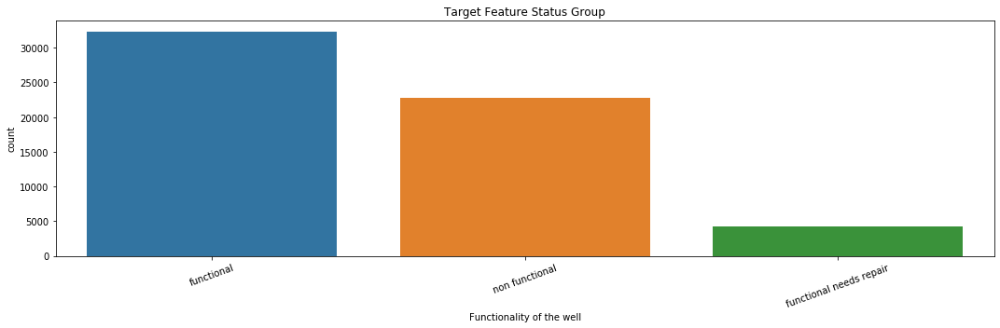

In [12]:
# Plotting of status_group
fig, ax = plt.subplots(1, 1, figsize=(15,5))
ax = sns.countplot(x="status_group", data=df_train_labels)
ax.set_title('Target Feature Status Group');
ax.set_xlabel('Functionality of the well')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout()
plt.savefig("figures/CountPlotStatusGroup.png")

# Analyzing Training Features

In [13]:
# Shape of the dataframe
df_raw.shape

(59400, 41)

In [14]:
# Info of dataframe
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
id                       59400 non-null int64
amount_tsh               59400 non-null float64
date_recorded            59400 non-null object
funder                   55765 non-null object
gps_height               59400 non-null int64
installer                55745 non-null object
longitude                59400 non-null float64
latitude                 59400 non-null float64
wpt_name                 59400 non-null object
num_private              59400 non-null int64
basin                    59400 non-null object
subvillage               59029 non-null object
region                   59400 non-null object
region_code              59400 non-null int64
district_code            59400 non-null int64
lga                      59400 non-null object
ward                     59400 non-null object
population               59400 non-null int64
public_meeting           56066 non-null object
r

**Date_recorded**

The `date_recorded` feature was parsed as an object, so I'll convert this to `datetime` below, and review the dates.

In [15]:
# Modificate date_recorded to datetime
df_raw.date_recorded = pd.to_datetime(df_raw.date_recorded)

In [16]:
# Description of date recorded after changement
df_raw.date_recorded.describe()

count                   59400
unique                    356
top       2011-03-15 00:00:00
freq                      572
first     2002-10-14 00:00:00
last      2013-12-03 00:00:00
Name: date_recorded, dtype: object

In [17]:
drop_feat('date_recorded')

## Missing Values NaN
**General overview**

In [18]:
# Checking Missing values NAN
df_raw.isnull().sum().sort_values(ascending=False)

scheme_name              28166
scheme_management         3877
installer                 3655
funder                    3635
public_meeting            3334
permit                    3056
subvillage                 371
ward                         0
lga                          0
district_code                0
region_code                  0
region                       0
num_private                  0
basin                        0
wpt_name                     0
latitude                     0
longitude                    0
gps_height                   0
date_recorded                0
amount_tsh                   0
population                   0
status_group                 0
recorded_by                  0
water_quality                0
waterpoint_type              0
source_class                 0
source_type                  0
source                       0
quantity_group               0
quantity                     0
quality_group                0
payment_type                 0
waterpoi

With regard to the categorical features, `scheme_name` is almost 50% missing, by far the greatest percentage in the categorical features. Since `scheme_name` refers to the specific name of who manages the maintenance of the well, this will be notably difficult to fill. Tanzania is highly decentralized when it comes to their water management, so even within highly granular locations, the differences in the scheme name can be unpredictable. 

Text(0.5, 1, 'Heatmap of Missing Categorical Values in the Training Set')

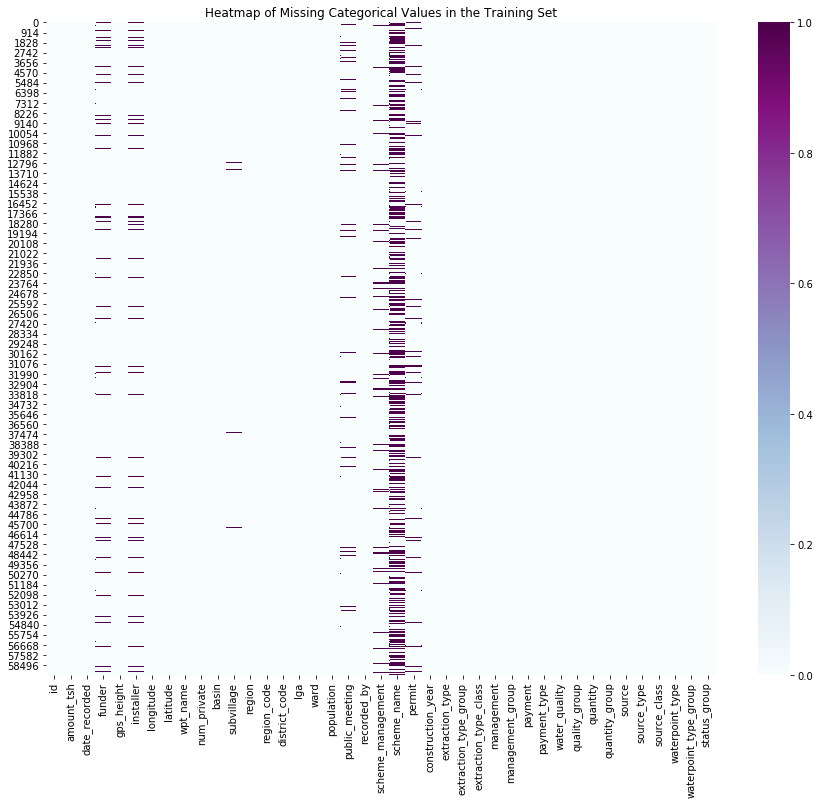

In [19]:
plt.figure(figsize=(15,12))
sns.heatmap(df_raw.isna(), cmap = "BuPu")
plt.title("Heatmap of Missing Categorical Values in the Training Set")

In [20]:
# Creating a Dataframe with the missing values and the percentage
NaN = pd.DataFrame(df_raw.isnull().sum(),columns=['Number'])
NaN['Percentage'] = round(NaN.Number/df_raw.shape[0]*100,1)
NaN[NaN.Number!=0].sort_values('Number',ascending=False).reset_index()

,index,Number,Percentage
0,scheme_name,28166,47.4
1,scheme_management,3877,6.5
2,installer,3655,6.2
3,funder,3635,6.1
4,public_meeting,3334,5.6
5,permit,3056,5.1
6,subvillage,371,0.6


In [21]:
# Creating a Dataframe with columns that have as input 0
zero = pd.DataFrame((df_raw==0).sum(),columns=['Number'])
zero['Percentage'] = round(zero.Number/df_raw.shape[0]*100,1)
zero[zero.Number!=0].sort_values('Number',ascending=False).reset_index()

,index,Number,Percentage
0,num_private,58643,98.7
1,amount_tsh,41639,70.1
2,population,21381,36.0
3,construction_year,20709,34.9
4,gps_height,20438,34.4
5,permit,17492,29.4
6,public_meeting,5055,8.5
7,longitude,1812,3.1
8,district_code,23,0.0
9,id,1,0.0


##  Numerical Features

### id
The id feature doesn't contain any information regarding the functionality of the waterpoints and will therefore be added to the to drop list.

In [22]:
# Adding the Id to the to drop column
drop_feat('id')

### amount_tsh
This feature refers to the amount of water available to the well.

In [23]:
# Value counts amount tsh
df_raw['amount_tsh'].value_counts()

0.00         41639
500.00        3102
50.00         2472
1000.00       1488
20.00         1463
200.00        1220
100.00         816
10.00          806
30.00          743
2000.00        704
250.00         569
300.00         557
5000.00        450
5.00           376
25.00          356
3000.00        334
1200.00        267
1500.00        197
6.00           190
600.00         176
4000.00        156
2400.00        145
2500.00        139
6000.00        125
7.00            69
8000.00         61
750.00          59
40.00           59
10000.00        57
12000.00        51
             ...  
16000.00         2
16300.00         2
800.00           2
11000.00         2
590.00           2
520.00           2
26000.00         2
13000.00         2
9.00             1
170000.00        1
200000.00        1
900.00           1
0.25             1
53.00            1
350000.00        1
306.00           1
120000.00        1
26.00            1
59.00            1
60000.00         1
5400.00          1
70000.00    

Lets begin by reviewing the potential missing values in the data set, then we can more closely examine the relationship this feature has with the target, and perhaps other features as well. This will be the methodology for all feature review.

In [24]:
# Sum of 0 Values amount_tsh
sum(df_raw['amount_tsh'] == 0)

41639

In [25]:
# Percantage of missing Values
txt = "{percent: .2f}% of the 'amount_tsh' observations are missing or 0."
percent = round(sum(df_raw['amount_tsh'] == 0)/df_raw.shape[0]*100)
print(txt.format(percent = percent))

 70.00% of the 'amount_tsh' observations are missing or 0.


In [26]:
#Descriptives including the 0 values
df_raw['amount_tsh'].describe()

count     59400.000000
mean        317.650385
std        2997.574558
min           0.000000
25%           0.000000
50%           0.000000
75%          20.000000
max      350000.000000
Name: amount_tsh, dtype: float64

An incredibly high number of the observations are marked as having no available water in the well. Although there may be many wells which have no water available to them, it is questionable that 70% of the observed wells dont contain any water.

Additionally, The maximum value seen in the descriptives above doesnt seem realistic. It won't be possible to fill these values based on the mean/median of the entire data set, as there might be a handful of high outliers which would strongly effect the mean/median after removement of the zero values. Even though this seems to be a very important feature which could explain the functionality of the existing wells.

In [27]:
#Descriptives grouped over regions
#Includes zero values
df_raw['amount_tsh'].groupby(df_raw['region']).describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Arusha,3350.0,360.923881,2274.915820,0.0,0.0,0.0,10.0,20000.0
Dar es Salaam,805.0,236.706832,2612.250698,0.0,0.0,50.0,50.0,45000.0
Dodoma,2201.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Iringa,5294.0,1206.347752,4782.562343,0.0,0.0,500.0,1000.0,117000.0
Kagera,3316.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Kigoma,2816.0,347.658026,851.803578,0.0,0.0,150.0,300.0,26000.0
Kilimanjaro,4379.0,256.826821,2184.879625,0.0,0.0,0.0,20.0,120000.0
Lindi,1546.0,28.405563,171.470406,0.0,0.0,0.0,20.0,5400.0
Manyara,1583.0,262.463677,1675.603743,0.0,0.0,0.0,20.0,50000.0


There are 4 regions in the above grouped descriptives which are exclusively 0, ie they have no observations for the entirety of the data.

In [28]:
# Number of Missing Observations in the 4 Regions
print("There are {} observations in the training data, in the four regions shown above, which have only 0 observations.".format(len(df_raw[df_raw['region'].isin(['Dodoma', 'Tabora', 'Mbeya', 'Kagera'])])))

There are 12115 observations in the training data, in the four regions shown above, which have only 0 observations.


In [29]:
df_raw[df_raw['amount_tsh'] > 0]['amount_tsh'].groupby(df_raw['status_group']).describe()

,count,mean,std,min,25%,50%,75%,max
status_group,,,,,,,,
functional,12553.0,1186.740162,6166.283045,0.25,50.0,250.0,1000.0,350000.0
functional needs repair,1269.0,908.548463,3468.461671,6.00,100.0,300.0,600.0,100000.0
non functional,3939.0,715.495202,2592.025587,0.20,50.0,200.0,500.0,117000.0


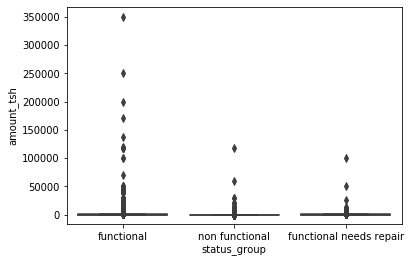

In [30]:
# Boxplots of the amount_tsh
ax = sns.boxplot(x="status_group", y="amount_tsh", data=df_raw)

It could be seen that that most of the wells (over 50%) are listed as functional but indeed 70% of those wells seem to have no water available (or the values are missing). Since this feature might be very important for the model prediction the values will be imputed by using the mean of each district location (ward). But neverless an imputation of this feature might distort the relationship between the functionality of the well and the `amount_tsh`.

In [31]:
# maybe this could be improved but for now this should be fine
#location = ['population','longitude','latitude','gps_height']
#location_nans(location,[df, validation, competition])

### gps_height
This feature refers to the elevation of the well, with respect to sea level, as acquired by gps readings.

In [32]:
# Missing Values
print("{}% of the gps_height observations are missing or 0.".format(round(sum(df_raw['gps_height'] == 0)/df_raw.shape[0]*100, 2)))

34.41% of the gps_height observations are missing or 0.


The majority of Tanzania is not located at sea level, a large proportion of these 0 observations must therefore be errouneous.

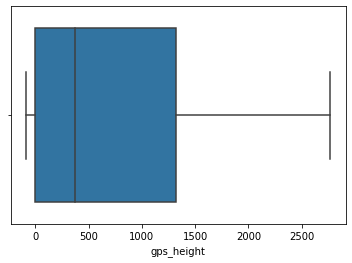

In [33]:
# Boxplot
ax = sns.boxplot(x=df_raw["gps_height"])

In [34]:
# maybe this could be improved but for now this should be fine
#location = ['population','gps_height','amount_tsh']
#location_nans(location,[df, validation, competition])v

### num_private
The meaning and content of the feature is unclear and mostly contains zero values. The feature will be therefore added to the to drop list.

In [35]:
df_raw['num_private']

0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
        ..
59370    0
59371    0
59372    0
59373    0
59374    0
59375    0
59376    0
59377    0
59378    0
59379    0
59380    0
59381    0
59382    0
59383    0
59384    0
59385    0
59386    0
59387    0
59388    0
59389    0
59390    0
59391    0
59392    0
59393    0
59394    0
59395    0
59396    0
59397    0
59398    0
59399    0
Name: num_private, Length: 59400, dtype: int64

In [36]:
# Missing Values
txt = "{percent: .2f}% of the 'amount_tsh' observations are missing or 0."
percent = sum(df_raw['num_private'] == 0)/df_raw.shape[0]*100
print(txt.format(percent = percent))

 98.73% of the 'amount_tsh' observations are missing or 0.


In [37]:
# Dropping num_private*
drop_feat('num_private')

### population
This feature lists the population found around the well.

In [38]:
sum(df_raw['population'].isna())

0

In [39]:
# Sum of 0 Values
sum(df_raw['population'] == 0)

21381

In [40]:
# Missing Values in percantage
txt = "{percent: .2f}% of the 'population' observations are missing or 0."
percent = sum(df_raw['population'] == 0)/df_raw.shape[0]*100
print(txt.format(percent = percent))

 35.99% of the 'population' observations are missing or 0.


In [41]:
# Description population
df_raw['population'].describe()

count    59400.000000
mean       179.909983
std        471.482176
min          0.000000
25%          0.000000
50%         25.000000
75%        215.000000
max      30500.000000
Name: population, dtype: float64

Again we see a very large number of 0 or missing values, and then a notably high maximum value.

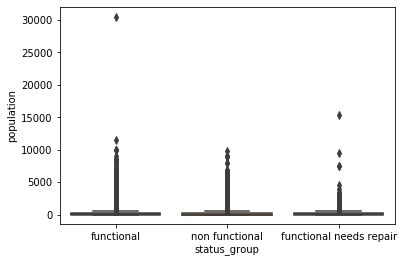

In [42]:
sns.boxplot(x = 'status_group', y = 'population', data = df_raw)

In [43]:
# Population by region
df_raw['population'].groupby(df_raw['region']).describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Arusha,3350.0,262.239104,442.690742,0.0,120.0,150.0,253.00,9500.0
Dar es Salaam,805.0,240.843478,534.198421,1.0,90.0,150.0,250.00,9865.0
Dodoma,2201.0,0.000000,0.000000,0.0,0.0,0.0,0.00,0.0
Iringa,5294.0,94.304307,190.406908,0.0,1.0,40.0,85.00,3072.0
Kagera,3316.0,0.000000,0.000000,0.0,0.0,0.0,0.00,0.0
Kigoma,2816.0,500.241832,590.075269,0.0,225.0,360.0,540.00,8500.0
Kilimanjaro,4379.0,105.747888,294.260177,1.0,1.0,40.0,120.00,8000.0
Lindi,1546.0,364.404916,400.230048,1.0,200.0,300.0,422.25,5050.0
Manyara,1583.0,317.778269,582.243701,1.0,150.0,213.0,324.50,15300.0


Again those same four regions are entirely devoid of information. They represent far too large of a percentage of the data to be dropped, but will prove to be the most difficult when filling them. In this case the missing values will be filled as done before with the `amount_tsh` and `gps_height`

### latitude and longitude
These two features describe the latitude and longitude, respectively, of the wells.

The listed center values for Tanzania, on Google Maps, are 6.3690° S, 34.8888° E. Values for West and South in the data set are marked as negative values.

In [44]:
# Latitude center
df_raw['latitude'].mean()

-5.706032659626431

In [45]:
#Longitude center
df_raw['longitude'].mean()

34.077426692028794

In [46]:
# Sum of 0 values (longitude)
sum(df_raw['longitude'] == 0)

1812

In [47]:
# Sum of 0 values (latitude)
sum(df_raw['latitude'] == 0)

0

There are 1812 observations for which the longitude is 0, but Tanzania does not cross the equator. As such, there are no locations in the data set which would actually take on a value of 0. 

In [48]:
# Latitude where longitude == 0
df_raw[df_raw['longitude'] == 0]['latitude'].head()#.groupby(X_train.subvillage).describe()

21    -2.000000e-08
53    -2.000000e-08
168   -2.000000e-08
177   -2.000000e-08
253   -2.000000e-08
Name: latitude, dtype: float64

In [49]:
# Sum of values where latitude == -2.000000e-08
sum(df_raw['latitude'] == -2.000000e-08)

1812

The value `-2.000000e-08` is used as the latitude missing flag in this data.

In [50]:
df_raw[df_raw['longitude'] == 0].groupby(df_raw.region).describe()

id                                                       \
            count          mean           std    min      25%      50%   
region                                                                   
Mwanza      807.0  38365.079306  21801.929635   15.0  18536.5  40272.0   
Shinyanga  1005.0  36606.739303  21073.965942  194.0  18436.0  35776.0   

                            amount_tsh                                     \
               75%      max      count mean  std  min  25%  50%  75%  max   
region                                                                      
Mwanza     56729.5  74190.0      807.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
Shinyanga  54378.0  74193.0     1005.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

          gps_height                                    longitude  ...  \
               count mean  std  min  25%  50%  75%  max     count  ...   
region                                                             ...   
Mwanza         807.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     807.0  ...   
Shinyanga     1005.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0    1005.0  ...   

          region_code district_code                                          \
                  max         count      mean       std  min  25%  50%  75%   
region                                                                        
Mwanza           19.0         807.0  4.350682  2.055000  1.0  2.0  6.0  6.0   
Shinyanga        17.0        1005.0  1.008955  0.163744  1.0  1.0  1.0  1.0   

               population                                     \
           max      count mean  std  min  25%  50%  75%  max   
region                                                         
Mwanza     6.0      807.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
Shinyanga  4.0     1005.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

          construction_year                                     
                      count mean  std  min  25%  50%  75%  max  
region                                                          
Mwanza                807.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  
Shinyanga            1005.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  

[2 rows x 80 columns]

The only observations which do not have known latitude and longitudes are found in, exclusively, two regions:
+ Mwanza
+ Shinyanga

Although all the missing values are found in the above two regions, the regions do have some known observations. I can use this information to fill the regions based on the mean value.

In [51]:
# imputing missing lat/long values
fill_lat_long(df_raw,0,-2.000000e-08)

In [52]:
# Map of the functional wells and population
fig = px.scatter_mapbox(
    df_raw,
    lat="latitude",
    lon="longitude",
    color="status_group",
    size="population",
    size_max=30,
    zoom=10,
    opacity=0.8,
    mapbox_style="carto-positron")
fig.show()

In [53]:
# Map of the population
fig = px.scatter_mapbox(
    df_raw,
    lat="latitude",
    lon="longitude",
    color="population",
    
    #size="population",
    size_max=30,
    zoom=10,
    opacity=0.8,
    mapbox_style="carto-positron")
fig.show()

### construction_year
This feature lists the year in which a specific well was constructed. Although included in the numeric features, this is a date [year].

In [54]:
txt = "{percent: .2f}% of the construction_year observations are missing."
percent = (sum(df_raw['construction_year'] == 0)/df_raw.shape[0])*100
print(txt.format(percent = percent))

 34.86% of the construction_year observations are missing.


In [55]:
df_raw[df_raw['construction_year'] == 0]['construction_year'].describe()['count']

20709.0

In [56]:
#Describe method
df_raw['construction_year'].describe()

count    59400.000000
mean      1300.652475
std        951.620547
min          0.000000
25%          0.000000
50%       1986.000000
75%       2004.000000
max       2013.000000
Name: construction_year, dtype: float64

In [57]:
# Value counts
df_raw['construction_year'].value_counts()

0       20709
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1980      811
1996      811
1984      779
1982      744
1994      738
1972      708
1974      676
1997      644
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: construction_year, dtype: int64

Wells in the data set, with observed construction years, were built between 1960 and 2013. I need to be certain that if I fill this value, I only imput integer values.

In [58]:
df_raw['construction_year'].groupby(df_raw['region']).describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Arusha,3350.0,1968.378806,245.060668,0.0,1995.0,2000.0,2008.0,2013.0
Dar es Salaam,805.0,1958.782609,288.091177,0.0,2000.0,2000.0,2010.0,2010.0
Dodoma,2201.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Iringa,5294.0,1857.084624,510.711422,0.0,1984.0,2000.0,2008.0,2011.0
Kagera,3316.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Kigoma,2816.0,1990.933949,119.364816,0.0,1990.0,2001.0,2007.0,2013.0
Kilimanjaro,4379.0,1980.585522,178.405958,0.0,1980.0,2002.0,2008.0,2013.0
Lindi,1546.0,1849.035576,519.566307,0.0,1980.0,1992.0,2007.0,2013.0
Manyara,1583.0,1985.672142,181.008620,0.0,1998.0,2004.0,2009.0,2013.0


The four same regions remain blank

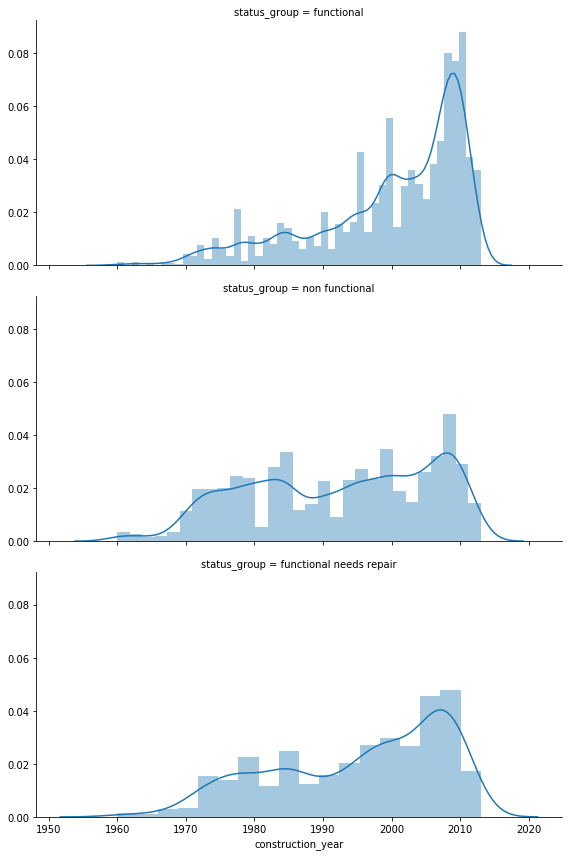

In [59]:
g = sns.FacetGrid(df_raw[df_raw['construction_year'] > 0], row="status_group", aspect = 2, height = 4)
g = g.map(sns.distplot, "construction_year")

There is a clear relationship between a well being functional and it being built more recently. The missing values will be imputed similarily as the previous features.

### Imputing missing values

In [60]:
#maybe this could be improved but for now this should be fine
location = ['population','gps_height','amount_tsh','construction_year']
location_nans(df_raw,['population','gps_height','amount_tsh'])

population : missing values:  0
gps_height : missing values:  0
amount_tsh : missing values:  0


,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.00,2011-03-14,Roman,1390.00,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109.0,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,250.00,2013-03-06,Grumeti,1399.00,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280.0,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.00,2013-02-25,Lottery Club,686.00,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250.0,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,50.00,2013-01-28,Unicef,263.00,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58.0,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,500.00,2011-07-13,Action In A,1300.00,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,250.0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
5,9944,20.00,2011-03-13,Mkinga Distric Coun,1335.00,DWE,39.172796,-4.765587,Tajiri,0,Pangani,Moa/Mwereme,Tanga,4,8,Mkinga,Moa,1.0,True,GeoData Consultants Ltd,VWC,Zingibali,True,2009,submersible,submersible,submersible,vwc,user-group,pay per bucket,per bucket,salty,salty,enough,enough,other,other,unknown,communal standpipe multiple,communal standpipe,functional
6,19816,30.00,2012-10-01,Dwsp,1064.00,DWSP,33.362410,-3.766365,Kwa Ngomho,0,Internal,Ishinabulandi,Shinyanga,17,3,Shinyanga Rural,Samuye,1.0,True,GeoData Consultants Ltd,VWC,NaN,True,0,swn 80,swn 80,handpump,vwc,user-group,never pay,never pay,soft,good,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
7,54551,512.50,2012-10-09,Rwssp,596.00,DWE,32.620617,-4.226198,Tushirikiane,0,Lake Tanganyika,Nyawishi Center,Shinyanga,17,3,Kahama,Chambo,200.0,True,GeoData Consultants Ltd,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,wug,user-group,unknown,unknown,milky,milky,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
8,53934,1000.00,2012-11-03,Wateraid,79.00,Water Aid,32.711100,-5.146712,Kwa Ramadhan Musa,0,Lake Tanganyika,Imalauduki,Tabora,14,6,Tabora Urban,Itetemia,250.0,True,GeoData Consultants Ltd,VWC,NaN,True,0,india mark ii,india mark ii,handpump,vwc,user-group,never pay,never pay,salty,salty,seasonal,seasonal,machine dbh,borehole,groundwater,hand pump,hand pump,non functional
9,46144,30.00,2011-08-03,Isingiro Ho,806.25,Artisan,30.626991,-1.257051,Kwapeto,0,Lake Victoria,Mkonomre,Kagera,18,1,Karagwe,Kaisho,315.0,True,GeoData Consultants Ltd,NaN,NaN,True,0,nira/tanira,nira/tanira,handpump,vwc,user-g

## Categorical Features

### funder 
This feature displays the funder of the well (Organization/Country/Bank)


In [61]:
df_raw['funder'].describe()

count                      55765
unique                      1897
top       Government Of Tanzania
freq                        9084
Name: funder, dtype: object

In [62]:
# Value counts of feature funder
df_raw['funder'].value_counts()

Government Of Tanzania         9084
Danida                         3114
Hesawa                         2202
Rwssp                          1374
World Bank                     1349
Kkkt                           1287
World Vision                   1246
Unicef                         1057
Tasaf                           877
District Council                843
Dhv                             829
Private Individual              826
Dwsp                            811
0                               777
Norad                           765
Germany Republi                 610
Tcrs                            602
Ministry Of Water               590
Water                           583
Dwe                             484
Netherlands                     470
Hifab                           450
Adb                             448
Lga                             442
Amref                           425
Fini Water                      393
Oxfam                           359
Wateraid                    

In [63]:
# filling 0 and null values with unknown
df_raw['funder'].fillna(value='Unknown',inplace=True)
df_raw['funder'].replace(to_replace = '0', value ='Unknown' , inplace=True)

In [64]:
# Checking the 20 most commen values
df_raw['funder'].value_counts().head(20)

Government Of Tanzania    9084
Unknown                   4416
Danida                    3114
Hesawa                    2202
Rwssp                     1374
World Bank                1349
Kkkt                      1287
World Vision              1246
Unicef                    1057
Tasaf                      877
District Council           843
Dhv                        829
Private Individual         826
Dwsp                       811
Norad                      765
Germany Republi            610
Tcrs                       602
Ministry Of Water          590
Water                      583
Dwe                        484
Name: funder, dtype: int64

In [65]:
# New Dataframe with 20 most common values (MAKE A FUNCTION FOR THIS !!!!)
df1 = df_raw.loc[df_raw['funder']== 'Government Of Tanzania']
df2 = df_raw.loc[df_raw['funder']== 'Unknown']              
df3 = df_raw.loc[df_raw['funder']== 'Danida'] 
df4 = df_raw.loc[df_raw['funder']== 'Hesawa'] 
df5 = df_raw.loc[df_raw['funder']== 'Rwssp'] 
df6 = df_raw.loc[df_raw['funder']== 'World Bank'] 
df7 = df_raw.loc[df_raw['funder']== 'Kkkt'] 
df8 = df_raw.loc[df_raw['funder']== 'World Vision']
df9 = df_raw.loc[df_raw['funder']== 'Unicef'] 
df10 = df_raw.loc[df_raw['funder']== 'Tasaf'] 
df11 = df_raw.loc[df_raw['funder']== 'District Council'] 
df12 = df_raw.loc[df_raw['funder']== 'Dhv'] 
df13 = df_raw.loc[df_raw['funder']== 'Private Individual'] 
df14 = df_raw.loc[df_raw['funder']== 'Dwsp'] 
df15 = df_raw.loc[df_raw['funder']== 'Norad'] 
df16 = df_raw.loc[df_raw['funder']== 'Germany Republi']
df17 = df_raw.loc[df_raw['funder']== 'Tcrs']
df18 = df_raw.loc[df_raw['funder']== 'Ministry Of Water']
df19 = df_raw.loc[df_raw['funder']== 'Water']
df20 = df_raw.loc[df_raw['funder']== 'Dwe']

df_funder = pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,
                          df13,df14,df15,df16,df17,df18,df19,df20], ignore_index=True)

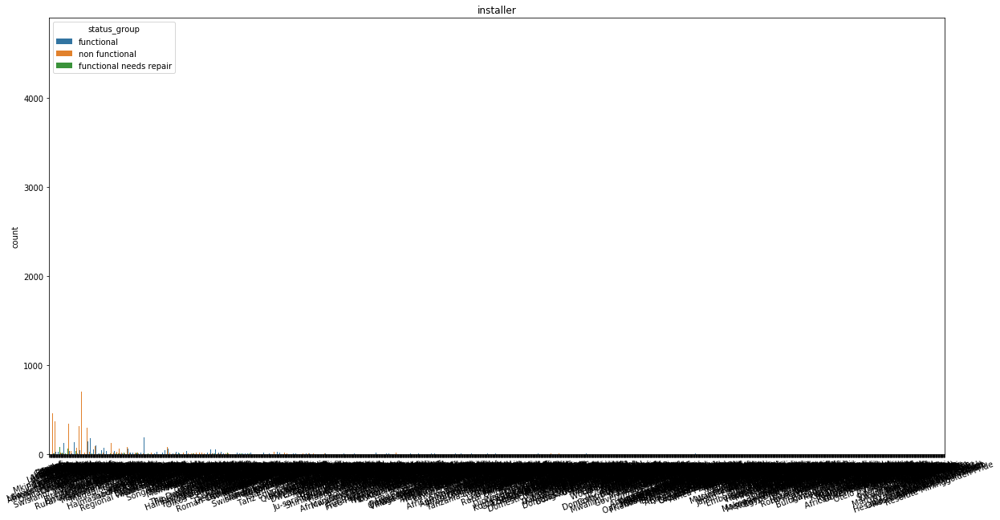

In [66]:
# Plotting the installer Feature
fig, ax1 = plt.subplots(1, 1, figsize=(20,10))
ax1 = sns.countplot(x="funder", data=df_raw, ax=ax1,hue='status_group')
ax1.set_title('installer');
ax1.set_xlabel('')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=20);

In [67]:
# To collect values together

df_raw['funder_cat'] = df_raw['funder'] #creating new column

c_fund = ['Danida','Unknown','Government Of Tanzania','Hesawa','Rwssp','World Bank','Kkkt', 'World Vision',
         'Unicef','Tasaf','District Council', 'Dhv', 'Private Individual', 'Dwsp','Norad','Germany Republi',
         'Tcrs','Ministry Of Water','Water','Dwe']
    

df_raw.loc[~df_raw["funder_cat"].isin(c_fund), "funder_cat"] = "Others"

df_raw['funder_cat'].replace(to_replace = 'Germany Republi' ,value ='Federal Republic of Germany' , inplace=True)

In [68]:
drop_feat('funder')

### installer
This feature displays the organization that installed the well

In [69]:
# Value counts of feature installer
df_raw['installer'].value_counts()

DWE                           17402
Government                     1825
RWE                            1206
Commu                          1060
DANIDA                         1050
KKKT                            898
Hesawa                          840
0                               777
TCRS                            707
Central government              622
CES                             610
Community                       553
DANID                           552
District Council                551
HESAWA                          539
LGA                             408
World vision                    408
WEDECO                          397
TASAF                           396
District council                392
Gover                           383
AMREF                           329
TWESA                           316
WU                              301
Dmdd                            287
ACRA                            278
World Vision                    270
SEMA                        

Many instances can be seen for this feature. In order to simplify all entries having less than 400 values will be added as Others and NaN will be marked as unknown. Further many mispelled values will be unified and corrected in order to reduce unique values.

In [70]:
# Handle NaN as Unknown
df_raw['installer'].fillna('Unknown',inplace=True)

In [71]:
# Handle 0 as Unknown
df_raw['installer'].replace(to_replace = '0', value ='Unknown' , inplace=True) # filling 0 values with unknown

In [72]:
# Replacing the spelling mistakes and collect same categories in same name (make a function !!!!)

df_raw['installer'].replace(to_replace = ('District Water Department', 'District water depar','Distric Water Department'),
                        value ='District water department' , inplace=True)

df_raw['installer'].replace(to_replace = ('FinW','Fini water','FINI WATER'), value ='Fini Water' , inplace=True)
df_raw['installer'].replace(to_replace = 'JAICA', value ='Jaica' , inplace=True)

df_raw['installer'].replace(to_replace = ('COUN', 'District COUNCIL', 'DISTRICT COUNCIL','District Counci', 
                                      'District Council','Council','Counc','District  Council','Distri'),
                                    value ='District council' , inplace=True)

df_raw['installer'].replace(to_replace = ('RC CHURCH', 'RC Churc', 'RC','RC Ch','RC C', 'RC CH','RC church', 
                                      'RC CATHORIC',) , value ='RC Church' , inplace=True)

df_raw['installer'].replace(to_replace = ('Central Government','Tanzania Government',
                                       'central government','Cental Government', 'Cebtral Government', 
                                      'Tanzanian Government','Tanzania government', 'Centra Government' ,
                                      'CENTRAL GOVERNMENT', 'TANZANIAN GOVERNMENT','Central govt', 'Centr', 
                                      'Centra govt') , value ='Central government' , inplace=True)

df_raw['installer'].replace(to_replace = ('World vision', 'World Division','World Vision'),
                                        value ='world vision' , inplace=True)

df_raw['installer'].replace(to_replace = ('Unisef','UNICEF'),value ='Unicef' , inplace=True)
df_raw['installer'].replace(to_replace = 'DANID', value ='DANIDA' , inplace=True)

df_raw['installer'].replace(to_replace = ('villigers', 'villager', 'Villagers', 'Villa', 'Village', 'Villi', 
                                      'Village Council','Village Counil', 'Villages', 'Vill', 'Village community', 
                                      'Villaers', 'Village Community', 'Villag','Villege Council', 'Village council',
                                      'Village  Council','Villagerd', 'Villager', 'Village Technician',
                                      'Village Office','Village community members'),
                                        value ='villagers' , inplace=True)

df_raw['installer'].replace(to_replace =('Commu','Communit','commu','COMMU', 'COMMUNITY') ,
                                        value ='Community' , inplace=True)

df_raw['installer'].replace(to_replace = ('GOVERNMENT', 'GOVER', 'GOVERNME', 'GOVERM','GOVERN','Gover','Gove',
                                      'Governme','Governmen' ) ,value ='Government' , inplace=True)

df_raw['installer'].replace(to_replace = 'Hesawa' ,value ='HESAWA' , inplace=True)

In [73]:
# continue to replacing spellin mistakes and getting together values
df_raw['installer'].replace(to_replace = ('Colonial Government') , value ='Colonial government' , inplace=True)
df_raw['installer'].replace(to_replace = ('Government of Misri') , value ='Misri Government' , inplace=True)
df_raw['installer'].replace(to_replace = ('Italy government') , value ='Italian government' , inplace=True)
df_raw['installer'].replace(to_replace = ('British colonial government') , value ='British government' , inplace=True)
df_raw['installer'].replace(to_replace = ('Concern /government') , value ='Concern/Government' , inplace=True)
df_raw['installer'].replace(to_replace = ('Village Government') , value ='Village government' , inplace=True)
df_raw['installer'].replace(to_replace = ('Government and Community') , value ='Government /Community' , inplace=True)
df_raw['installer'].replace(to_replace = ('Cetral government /RC') , value ='RC church/Central Gover' , inplace=True)
df_raw['installer'].replace(to_replace = ('Government /TCRS','Government/TCRS') , value ='TCRS /Government' , inplace=True)
df_raw['installer'].replace(to_replace = ('ADRA /Government') , value ='ADRA/Government' , inplace=True)

In [74]:
df_raw['installer'].value_counts().head(20)#taking most 20 common installer

DWE                   17402
Unknown                4435
Government             2660
Community              1674
DANIDA                 1602
HESAWA                 1379
RWE                    1206
District council       1179
Central government     1114
KKKT                    898
TCRS                    707
world vision            681
CES                     610
Fini Water              593
RC Church               461
villagers               408
LGA                     408
WEDECO                  397
TASAF                   396
Unicef                  332
Name: installer, dtype: int64

In [75]:
# Creating new dataframe which just picks our desired values (MAKE A FUNCTION)
df_1 = df_raw.loc[df_raw['installer']== 'DWE']
df_2 = df_raw.loc[df_raw['installer']== 'Unknown']              
df_3 = df_raw.loc[df_raw['installer']== 'Government'] 
df_4 = df_raw.loc[df_raw['installer']== 'Community'] 
df_5 = df_raw.loc[df_raw['installer']== 'DANIDA'] 
df_6 = df_raw.loc[df_raw['installer']== 'RWE'] 
df_7 = df_raw.loc[df_raw['installer']== 'District council'] 
df_8 = df_raw.loc[df_raw['installer']== 'Central government']
df_9 = df_raw.loc[df_raw['installer']== 'KKKT'] 
df_10 = df_raw.loc[df_raw['installer']== 'HESAWA'] 
df_11 = df_raw.loc[df_raw['installer']== 'TCRS'] 
df_12 = df_raw.loc[df_raw['installer']== 'world vision'] 
df_13 = df_raw.loc[df_raw['installer']== 'CES'] 
df_14 = df_raw.loc[df_raw['installer']== 'Fini Water'] 
df_15 = df_raw.loc[df_raw['installer']== 'RC Church'] 
df_16 = df_raw.loc[df_raw['installer']== 'villagers']
df_17 = df_raw.loc[df_raw['installer']== 'LGA']

df_installer = pd.concat([df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8,df_9,df_10,df_11,df_12,
                          df_13,df_14,df_15,df_16,df_17], ignore_index=True)

In [76]:
# To make new categorizes, creating new column
df_raw['installer_cat'] = df_raw['installer'] 

In [77]:
c_ins = ['DWE','Unknown','Government','Community','DANIDA','RWE','District council', 'Central government',
         'KKKT','HESAWA','TCRS', 'world vision', 'Fini Water', 'RC Church','villagers','LGA']


df_raw.loc[~df_raw["installer_cat"].isin(c_ins), "installer_cat"] = "Others"
# converting the values which has less than 400 value counts to others

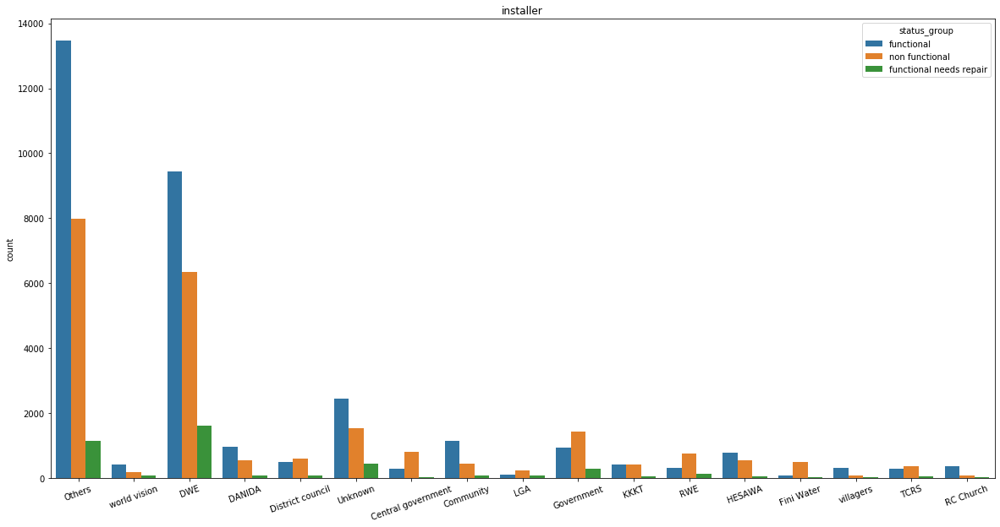

In [78]:
# Plotting the installer Feature
fig, (ax1) = plt.subplots(1, 1, figsize=(20,10))
ax1 = sns.countplot(x="installer_cat", data=df_raw, ax=ax1,hue='status_group')
ax1.set_title('installer');
ax1.set_xlabel('')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=20);

In [79]:
drop_feat('installer')

The first two categorical features of interest are `funder` and `installer`, with 1897 and 2145 unique values, respectively. These refer to who funded the installation of the well, and who installed the well. 

The `installer` feature seems to be entered by hand with little to no regard for consistency when it comes to spelling, abbreviations, or language. Even the manner is which missing values were recorded has no standard; some missing values are marked with 0, others with the phrases "Unknown", "Not known", "Not kno", and "Uknown Installer", to provide simply a few examples.  

The `funder` feature is slightly less error-prone, but faces similar issues overall. For example, it appears that a few wells were funded by the Swedish government. These different wells are listed as being funded by:
+ Sweden
+ Swedish
+ Sweeden
+ Swidish



### wpt_name
This feature provides the name of the waterpoints but unlikely it will reveal crucial information about their functionality. Further this feature has a high quantity of unique values over 37000. Therefore this feature will be added to the features to drop list.

In [80]:
# Value counts head 
df_raw['wpt_name'].describe()

count     59400
unique    37400
top        none
freq       3563
Name: wpt_name, dtype: object

In [81]:
# Adding wpt_name to dropping list
drop_feat('wpt_name')

### Location Features

**`subvillage`**

In [82]:
# Unique Values
df_raw.subvillage.describe()

count        59029
unique       19287
top       Madukani
freq           508
Name: subvillage, dtype: object

With the greatest number of unique values behind `wpt_name` (19,000+), the `subvillage` feature is a list of the names of the villages containing the wells. With its incredibly high number of levels, it is difficult to use this feature in modeling. As the location information is captured with less granularity at higher levels, I'll drop `subvillage` from the modeling data.

In [83]:
# Adding subvillage to dropping list
drop_feat('subvillage')

**`ward`**

In [84]:
df_raw.ward.describe()

count     59400
unique     2092
top       Igosi
freq        307
Name: ward, dtype: object

`ward`, with just over 2000 unique values, provides information about which ward the well is found in in Tanzania. As I have multiple categorical features which provide less granular geographical information, and lat/long values, I'll most likely be dropping this from the modeling data set.

In [85]:
# Adding ward to dropping list
drop_feat('ward')

**`lga`**  
`lga` marks the district in which the well is found.

In [86]:
#Number of missing values
df_raw['lga'].isna().sum()

0

This feature has no missing values

In [87]:
df_raw.lga.describe()

count      59400
unique       125
top       Njombe
freq        2503
Name: lga, dtype: object

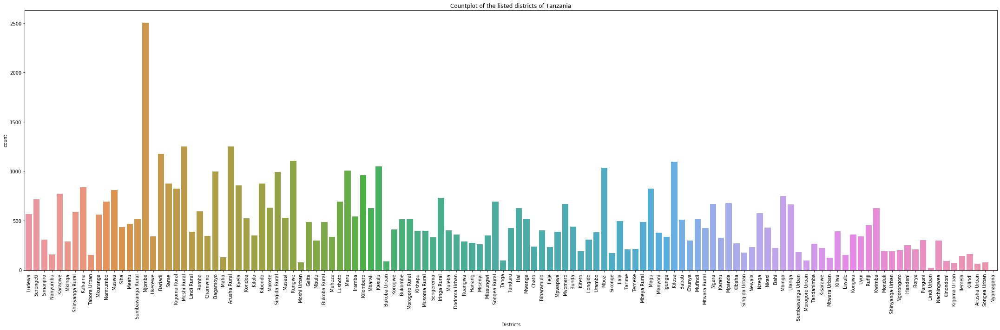

In [88]:
# Countplot lga
fig, ax = plt.subplots(1, 1, figsize=(30,10))
ax = sns.countplot(x="lga", data=df_raw)
ax.set_title('Countplot of the listed districts of Tanzania');
ax.set_xlabel('Districts')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);
plt.tight_layout() 

The `lga` feature has 125 unique levels, which is a much more acceptable number for modeling and will be therefore included for modelling.

**`district_code`**

In [89]:
#District code descriptive information
df_raw['district_code'].describe()

count    59400.000000
mean         5.629747
std          9.633649
min          0.000000
25%          2.000000
50%          3.000000
75%          5.000000
max         80.000000
Name: district_code, dtype: float64

Although there are 125 listed districts in the `lga` feature, there are only 81 (0-80) different district codes. 

In [90]:
df_raw['district_code'].groupby(df_raw['lga']).describe()

,count,mean,std,min,25%,50%,75%,max
lga,,,,,,,,
Arusha Rural,1252.0,2.036741,0.188201,2.0,2.0,2.0,2.0,3.0
Arusha Urban,63.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0
Babati,511.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
Bagamoyo,997.0,1.013039,0.113499,1.0,1.0,1.0,1.0,2.0
Bahi,224.0,6.000000,0.000000,6.0,6.0,6.0,6.0,6.0
Bariadi,1177.0,1.007647,0.151330,1.0,1.0,1.0,1.0,4.0
Biharamulo,403.0,4.000000,0.000000,4.0,4.0,4.0,4.0,4.0
Bukoba Rural,487.0,2.000000,0.000000,2.0,2.0,2.0,2.0,2.0
Bukoba Urban,88.0,6.000000,0.000000,6.0,6.0,6.0,6.0,6.0


It cant be cleary defined at this point the exact relation of the district code and other geographic components. I will exclude this feature from my model.

In [91]:
# Adding district_code to dropping list
drop_feat('district_code')

**`region`**

In [92]:
df_raw.region.describe()

count      59400
unique        21
top       Iringa
freq        5294
Name: region, dtype: object

In [93]:
df_raw.region.value_counts()

Iringa           5294
Shinyanga        4982
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Arusha           3350
Kagera           3316
Mwanza           3102
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: region, dtype: int64

There are 21 different regions listed in this data set with no missing values.I'm already aware of the fact that the regions are not listed as according to the most recent Tanzania census data, so the fact that this doesn't match then known 31 regions of Tanzania is not surprising to me.
I'll be updating these based on the census data, and then including this feature in the modeling data set.

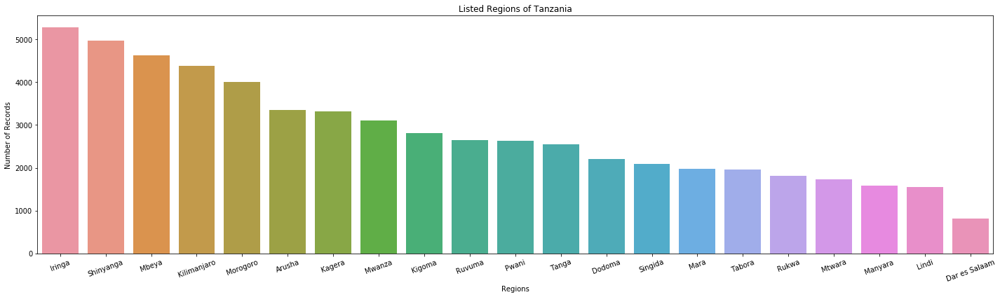

In [94]:
# Countplot regions
order = ["Iringa", 'Shinyanga', 'Mbeya', 'Kilimanjaro', 'Morogoro', 'Arusha', 'Kagera', 'Mwanza', 'Kigoma','Ruvuma','Pwani','Tanga','Dodoma','Singida','Mara','Tabora','Rukwa','Mtwara','Manyara','Lindi','Dar es Salaam']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="region", data=df_raw,order=order)
ax.set_title('Listed Regions of Tanzania');
ax.set_xlabel('Regions')
ax.set_ylabel('Number of Records')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

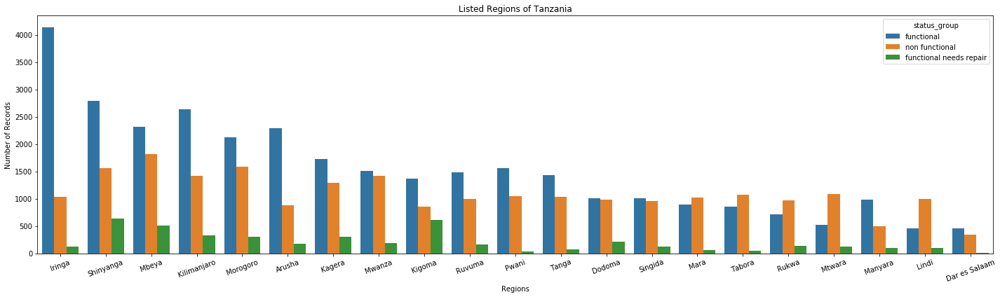

In [95]:
# Countplot regions
order = ["Iringa", 'Shinyanga', 'Mbeya', 'Kilimanjaro', 'Morogoro', 'Arusha', 'Kagera', 'Mwanza', 'Kigoma','Ruvuma','Pwani','Tanga','Dodoma','Singida','Mara','Tabora','Rukwa','Mtwara','Manyara','Lindi','Dar es Salaam']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="region", data=df_raw,order=order, hue='status_group')
ax.set_title('Listed Regions of Tanzania');
ax.set_xlabel('Regions')
ax.set_ylabel('Number of Records')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

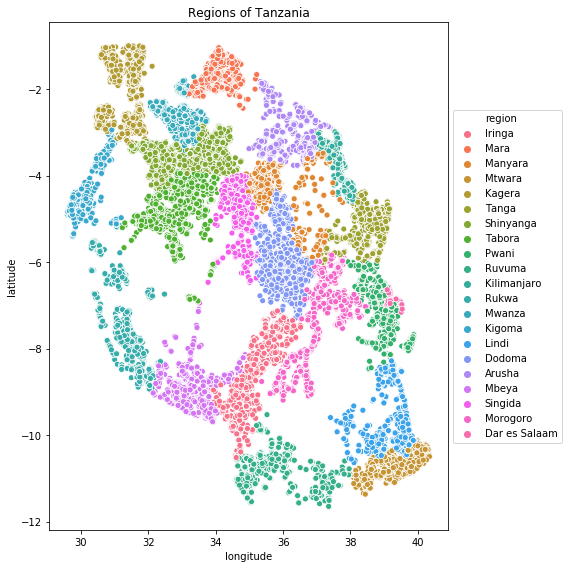

In [96]:
# scatterplot regions (TRY ON TABLEAU)
fig, ax = plt.subplots(1, 1, figsize=(8,8))
ax = sns.scatterplot(x="longitude", y = 'latitude', data=df_raw, hue='region')
ax.set_title('Regions of Tanzania');
ax.set_xlabel('longitude')
ax.set_ylabel('latitude')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));
#ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

**`region_code`**

In [97]:
# describe region_code
df_raw.region_code.describe()

count    59400.000000
mean        15.297003
std         17.587406
min          1.000000
25%          5.000000
50%         12.000000
75%         17.000000
max         99.000000
Name: region_code, dtype: float64

In [98]:
# len of unique values region_code
len(df_raw.region_code.unique())

27

In [99]:
#X_train['region'].groupby(X_train['region_code']).describe()
df_raw['region_code'].groupby(df_raw['region']).describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Arusha,3350.0,4.140896,6.521423,2.0,2.0,2.0,2.0,24.0
Dar es Salaam,805.0,7.000000,0.000000,7.0,7.0,7.0,7.0,7.0
Dodoma,2201.0,1.000000,0.000000,1.0,1.0,1.0,1.0,1.0
Iringa,5294.0,11.000000,0.000000,11.0,11.0,11.0,11.0,11.0
Kagera,3316.0,18.000000,0.000000,18.0,18.0,18.0,18.0,18.0
Kigoma,2816.0,16.000000,0.000000,16.0,16.0,16.0,16.0,16.0
Kilimanjaro,4379.0,3.000000,0.000000,3.0,3.0,3.0,3.0,3.0
Lindi,1546.0,65.707633,28.672324,8.0,80.0,80.0,80.0,80.0
Manyara,1583.0,21.000000,0.000000,21.0,21.0,21.0,21.0,21.0


It does appear, from the above grouped object, that some of the regions which have multiple region codes have these due to typos (ie. Lindi is maarked with the region codes 8 and 80) or Mtware has as 9 and 90 as region codes. Due to the fact that other (cleaner) geographical features are available this feature will be excluded from the model.

In [100]:
drop_feat('region_code')

### Extraction Features
These features describe how the water is extracted for the well. They are displayed here in decreasing order of granularity.

**`extraction_type`**  **`extraction_type_group`** **`extraction_type_class`**

This feature describes how the water is extracted for the well, with the greatest amount of granularity.

These 3 features contain the same information but differentiate in their depth of detail. For further processing the extraction_type feature will be kept and some categories will be grouped for the sake of simplicity. The other two features will be excluded.

In [101]:
df_raw['extraction_type'].describe()

count       59400
unique         18
top       gravity
freq        26780
Name: extraction_type, dtype: object

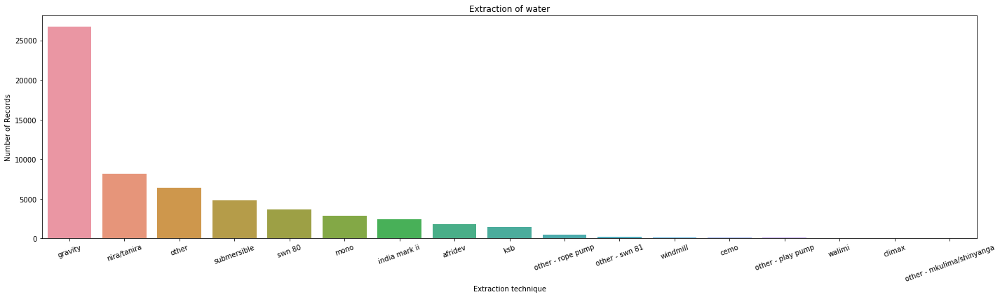

In [102]:
order = ['gravity', 'nira/tanira', 'other', 'submersible', 'swn 80', 'mono', 'india mark ii', 'afridev', 'ksb', 'other - rope pump', 'other - swn 81', 'windmill', 'cemo', 'other - play pump', 'walimi', 'climax', 'other - mkulima/shinyanga']


fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="extraction_type", data=df_raw, order=order)
ax.set_title("Extraction of water");
ax.set_xlabel("Extraction technique")
ax.set_ylabel("Number of Records")
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

In [103]:
# Simplefying extraction type feature and creating new feature
dict_extraction_type= {'gravity': 'gravity', 'nira/tanira':'nira/tanira','other':'other','submersible':'submersible',
                 'swn 80':'swn','mono':'mono', 'india mark ii': 'india mark', 'afridev':'afridev','ksb':'ksb',
                      'other - rope pump':'other','other - swn 81':'swn','windmill':'other','india mark iii':'india mark'
                      ,'cemo':'other','other - play pump':'other','walimi':'other','climax':'other','other - mkulima/shinyanga':'other'} 
    
df_raw['extraction_custom'] = df_raw['extraction_type'].replace(dict_extraction_type)

In [104]:
df_raw['extraction_custom'].value_counts()


gravity        26780
nira/tanira     8154
other           7255
submersible     4764
swn             3899
mono            2865
india mark      2498
afridev         1770
ksb             1415
Name: extraction_custom, dtype: int64

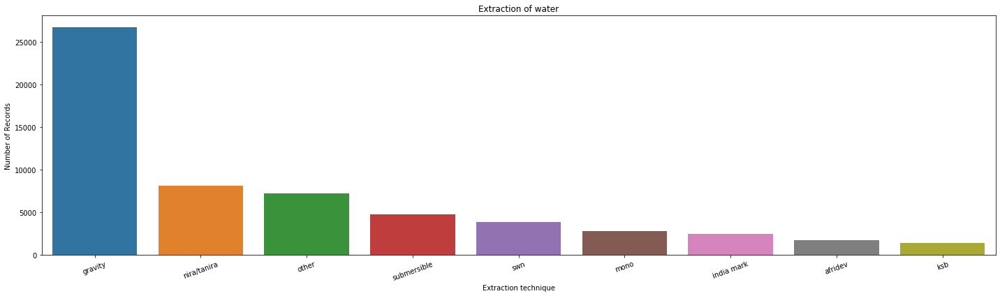

In [105]:
# Plotting of extraction types
order = ['gravity', 'nira/tanira', 'other', 'submersible', 'swn', 'mono', 'india mark', 'afridev', 'ksb']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="extraction_custom", data=df_raw, order=order)
ax.set_title("Extraction of water");
ax.set_xlabel("Extraction technique")
ax.set_ylabel("Number of Records")
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

Text(0.5, 1.0, 'Water extraction: Gravity pump')

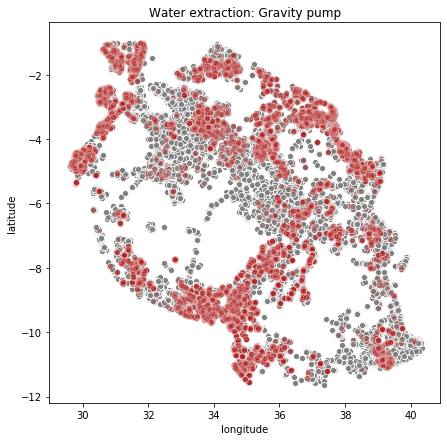

In [106]:
# Location of gravity pumps
plt.figure(figsize=(7,7))
sns.scatterplot(x='longitude',y='latitude',data=df_raw,color='grey');
sns.scatterplot(x='longitude',y='latitude',alpha=0.2, data=df_raw[df_raw.extraction_custom=='gravity'],color='firebrick')
plt.title('Water extraction: Gravity pump')

In [107]:
# Add original features to the to delete list
drop_feat(['extraction_type','extraction_type_class','extraction_type_group'])

### Management Features
These features refer to who manages or maintains the wells. Frequently these are highly regionally specific, due to the decentralization of water system management in Tanzania.

These 2 features contain the same information but differentiate in their depth of detail. For further processing the management feature will be kept and some categories will be grouped for the sake of simplicity.

**`management`**  **`management_group`**  


In [108]:
# Value Counts management feature
df_raw.management.value_counts()

vwc                 40507
wug                  6515
water board          2933
wua                  2535
private operator     1971
parastatal           1768
water authority       904
other                 844
company               685
unknown               561
other - school         99
trust                  78
Name: management, dtype: int64

In [109]:
# Value Counts management feature
df_raw.management_group.value_counts()

user-group    52490
commercial     3638
parastatal     1768
other           943
unknown         561
Name: management_group, dtype: int64

In [110]:
# Simplefying management type feature
dict_management_type= {'vwc':'vwc','wug':'wug','water board':'water board','wua':'wua','private operator':
                      'private operator','parastatal':'parastatal','water authority':'water authority',
                      'other':'other','company':'other','unknown':'other','other - school':'other','trust':'other'} 
    
df_raw['management_custom'] = df_raw['management'].replace(dict_management_type)

In [111]:
# Value Counts management feature
df_raw.management_custom.value_counts()

vwc                 40507
wug                  6515
water board          2933
wua                  2535
other                2267
private operator     1971
parastatal           1768
water authority       904
Name: management_custom, dtype: int64

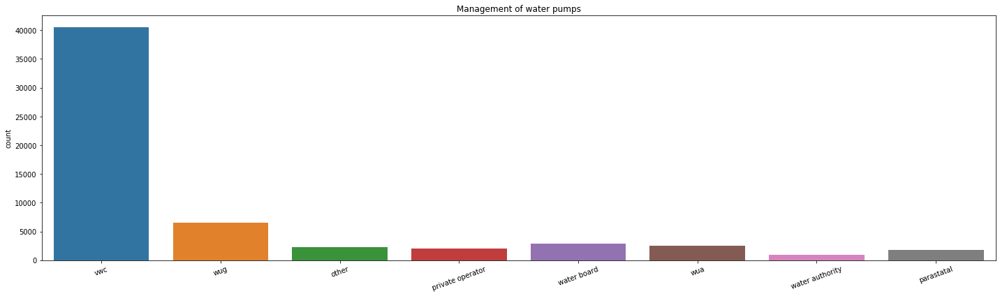

In [112]:
# Plotting of management types
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="management_custom", data=df_raw)
ax.set_title('Management of water pumps');
ax.set_xlabel('')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

In [113]:
# Add original features to the to delete list
drop_feat(['management','management_group'])

**`scheme_management`** **`scheme_name`** 

This feature describes who manages the well.

Both the **`scheme_name`** feature and the **`scheme_management`** feature contain information considering the Operator of the waterpoint. Looking at the NaN Dataframe created above almost 50 % of the Data is missing for the scheme_name feature compared to the 7 % of the scheme_management feature. Further the **`scheme_management`** Feature has less unique values and contains the same information as the **`scheme_name`** with 2696 unique values.   Therefore the scheme name_feature will be dropped.

In [114]:
df_raw.scheme_management.describe()

count     55523
unique       12
top         VWC
freq      36793
Name: scheme_management, dtype: object

In [115]:
# Instances of scheme_management
df_raw['scheme_management'].value_counts()

VWC                 36793
WUG                  5206
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 766
SWC                    97
Trust                  72
None                    1
Name: scheme_management, dtype: int64

In [116]:
df_raw.scheme_name.describe()

count     31234
unique     2696
top           K
freq        682
Name: scheme_name, dtype: object

In [117]:
# Handle NaN as Unknown
df_raw['scheme_management'].fillna('Unknown',inplace=True)

In [118]:
# Replace SWC, Trust and None to Others since little entries are given 
df_raw['scheme_management'] = df_raw['scheme_management'].replace(['SWC','Trust','None'],'Other')

In [119]:
df_raw['scheme_management'].value_counts()

VWC                 36793
WUG                  5206
Unknown              3877
Water authority      3153
WUA                  2883
Water Board          2748
Parastatal           1680
Private operator     1063
Company              1061
Other                 936
Name: scheme_management, dtype: int64

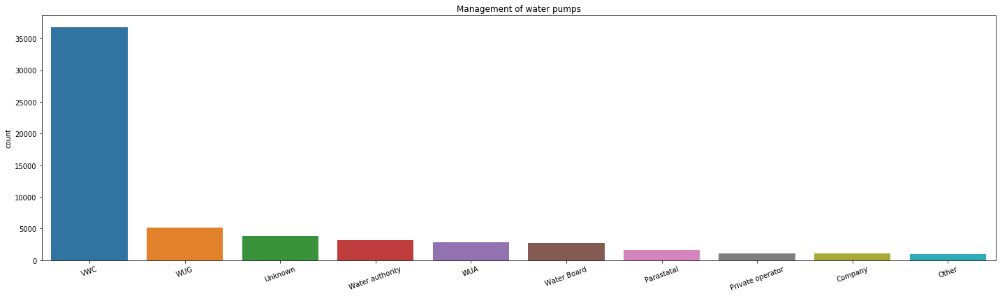

In [120]:
# Plotting of management types
order= ['VWC','WUG','Unknown','Water authority','WUA','Water Board','Parastatal','Private operator','Company','Other']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="scheme_management", data=df_raw, order=order)
ax.set_title('Management of water pumps');
ax.set_xlabel('')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

In [121]:
drop_feat('scheme_name')

### Source Features

**`source`** **`source_type`** **`source_class`** 

In [122]:
df_raw['source'].describe()

count      59400
unique        10
top       spring
freq       17021
Name: source, dtype: object


**`source`**  is the most granular representation of how the water for the well is sourced.

In [123]:
df_raw['source'].value_counts()

spring                  17021
shallow well            16824
machine dbh             11075
river                    9612
rainwater harvesting     2295
hand dtw                  874
lake                      765
dam                       656
other                     212
unknown                    66
Name: source, dtype: int64

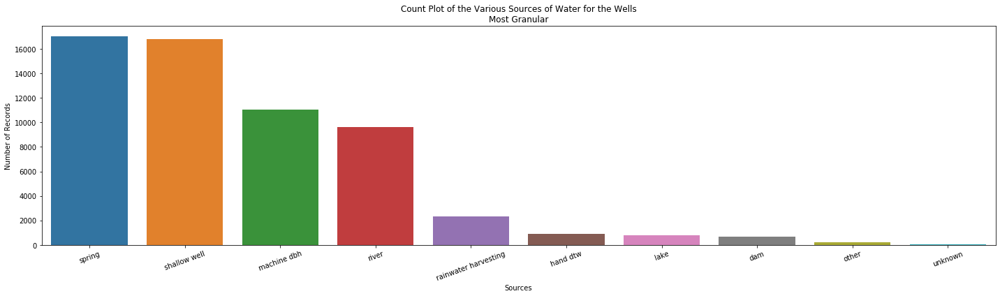

In [124]:
order = ["spring", 'shallow well', 'machine dbh', 'river', 'rainwater harvesting', 'hand dtw', 'lake', 'dam', 'other', 'unknown']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="source", data=df_raw, order=order)
ax.set_title("Count Plot of the Various Sources of Water for the Wells\nMost Granular");
ax.set_xlabel("Sources")
ax.set_ylabel("Number of Records")
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 


In [125]:
# Groupby of all 3 features
df_raw.groupby(['source','source_type','source_class']).size()

source                source_type           source_class
dam                   dam                   surface           656
hand dtw              borehole              groundwater       874
lake                  river/lake            surface           765
machine dbh           borehole              groundwater     11075
other                 other                 unknown           212
rainwater harvesting  rainwater harvesting  surface          2295
river                 river/lake            surface          9612
shallow well          shallow well          groundwater     16824
spring                spring                groundwater     17021
unknown               other                 unknown            66
dtype: int64

In [126]:
# Value counts source type
df_raw.source_type.value_counts()

spring                  17021
shallow well            16824
borehole                11949
river/lake              10377
rainwater harvesting     2295
dam                       656
other                     278
Name: source_type, dtype: int64

In [127]:
# Value counts source_class
df_raw.source_class.value_counts()

groundwater    45794
surface        13328
unknown          278
Name: source_class, dtype: int64

Those feature contain the same information but differentiate in their depth of detail. The **`source`** feature explaines in the overall sense the origen of the water (groundwater or surface). The other two features go into more detail with **`source`** given most of the details. It cannot be said at this point whether the **`source_type`** or the **`source`** feature might be more valuable for the model prediction. At this point the **`source`** feature which contains most of the details will be kept for building the model and the others will be dropt. Further the unkown category will be added to other for the sake of simplicity.

In [128]:
# Replace SWC, Trust and None to Others since little entries are given 
df_raw['source'] = df_raw['source'].replace(['unknown'],'other')

In [129]:
df_raw['source'].value_counts()

spring                  17021
shallow well            16824
machine dbh             11075
river                    9612
rainwater harvesting     2295
hand dtw                  874
lake                      765
dam                       656
other                     278
Name: source, dtype: int64

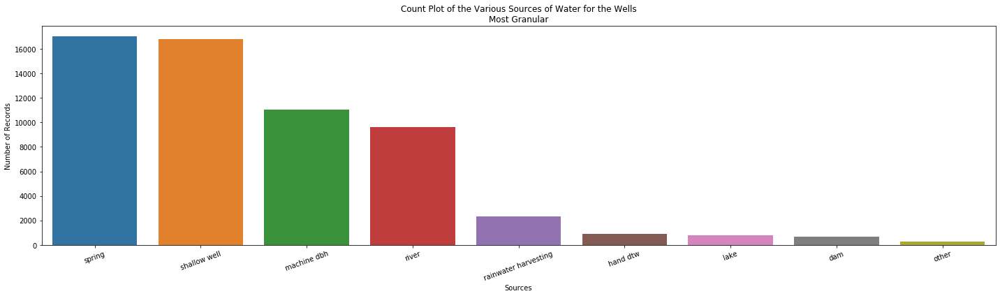

In [130]:
order = ["spring", 'shallow well', 'machine dbh', 'river', 'rainwater harvesting', 'hand dtw', 'lake', 'dam', 'other']

fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="source", data=df_raw, order=order)
ax.set_title("Count Plot of the Various Sources of Water for the Wells\nMost Granular");
ax.set_xlabel("Sources")
ax.set_ylabel("Number of Records")
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

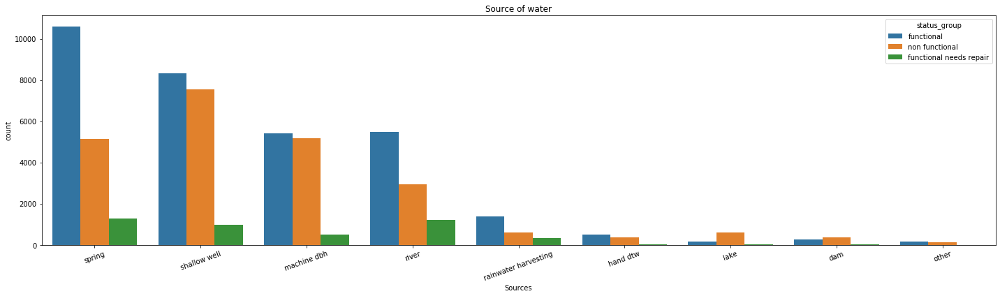

In [131]:
# Plotting of source functionality
order = ["spring", 'shallow well', 'machine dbh', 'river', 'rainwater harvesting', 'hand dtw', 'lake', 'dam', 'other']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="source", data=df_raw, order=order , hue='status_group')
ax.set_title('Source of water');
ax.set_xlabel('Sources')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

In [132]:
drop_feat(['source_type','source_class'])

### Payment Features
These features descried how the well is paid for.

**`payment`** and **`payment_type`**

In [133]:
# description of payment
df_raw['payment'].describe()

count         59400
unique            7
top       never pay
freq          25348
Name: payment, dtype: object

In [134]:
# Value Counts
df_raw['payment'].value_counts()

never pay                25348
pay per bucket            8985
pay monthly               8300
unknown                   8157
pay when scheme fails     3914
pay annually              3642
other                     1054
Name: payment, dtype: int64

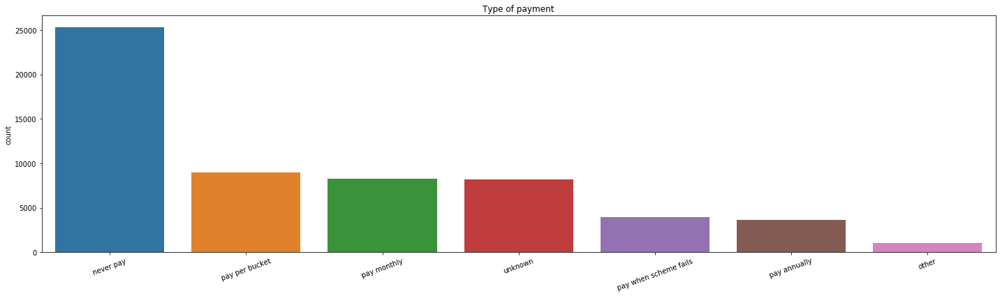

In [135]:
order = ['never pay', 'pay per bucket', 'pay monthly', 'unknown', 'pay when scheme fails', 'pay annually', 'other']
# Plotting of management types
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="payment", data=df_raw, order=order)
ax.set_title('Type of payment');
ax.set_xlabel('')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

In [136]:
# description of payment
df_raw['payment_type'].describe()

count         59400
unique            7
top       never pay
freq          25348
Name: payment_type, dtype: object

In [137]:
# Value Counts
df_raw['payment_type'].value_counts()

never pay     25348
per bucket     8985
monthly        8300
unknown        8157
on failure     3914
annually       3642
other          1054
Name: payment_type, dtype: int64

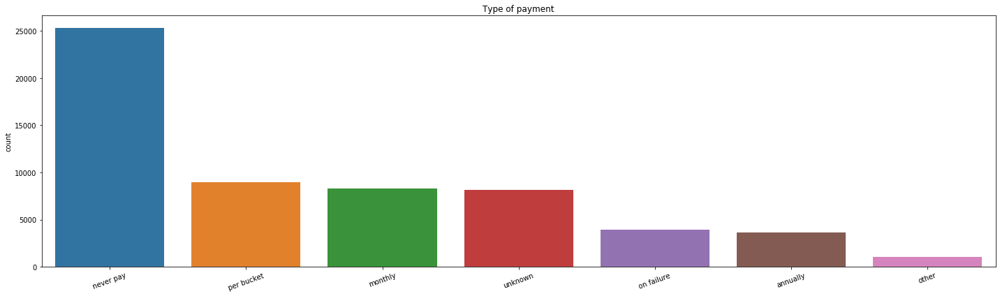

In [138]:
order = ['never pay', 'per bucket', 'monthly', 'unknown', 'on failure', 'annually', 'other']
# Plotting of payment types
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="payment_type", data=df_raw, order=order)
ax.set_title('Type of payment');
ax.set_xlabel('')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

These rows are identical and only differ slightly in their description. The payment feature will be therefore dropped

In [139]:
# adding feature to dropping list
drop_feat('payment')

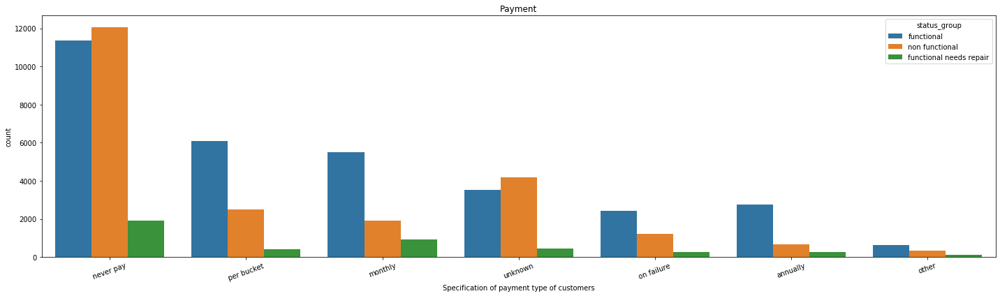

In [140]:
# Plotting of payment
order = ['never pay', 'per bucket', 'monthly', 'unknown', 'on failure', 'annually', 'other']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="payment_type", data=df_raw, order=order , hue='status_group')
ax.set_title('Payment');
ax.set_xlabel('Specification of payment type of customers')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

### Quality Features
These features describe the quality of the water the well provides.

**`water_quality`** and **`quality_group`**

In [141]:
df_raw['water_quality'].describe()

count     59400
unique        8
top        soft
freq      50818
Name: water_quality, dtype: object

In [142]:
df_raw['water_quality'].value_counts()

soft                  50818
salty                  4856
unknown                1876
milky                   804
coloured                490
salty abandoned         339
fluoride                200
fluoride abandoned       17
Name: water_quality, dtype: int64

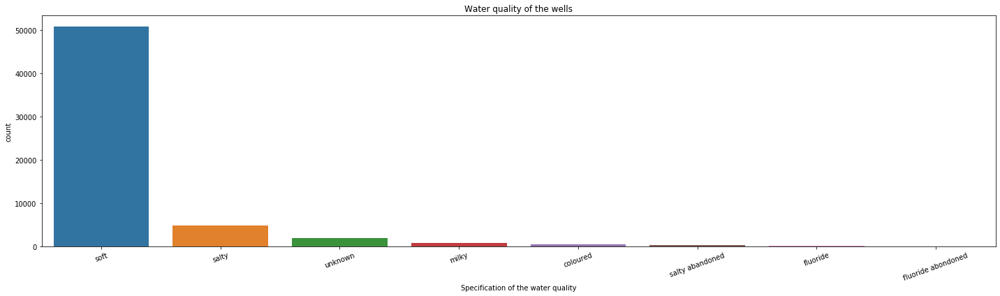

In [143]:
# Plotting of water quality
order = ['soft', 'salty', 'unknown', 'milky', 'coloured', 'salty abandoned', 'fluoride', 'fluoride abondoned']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="water_quality", data=df_raw, order=order)
ax.set_title('Water quality of the wells');
ax.set_xlabel('Specification of the water quality')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

In [144]:
df_raw['quality_group'].describe()

count     59400
unique        6
top        good
freq      50818
Name: quality_group, dtype: object

In [145]:
df_raw['quality_group'].value_counts()

good        50818
salty        5195
unknown      1876
milky         804
colored       490
fluoride      217
Name: quality_group, dtype: int64

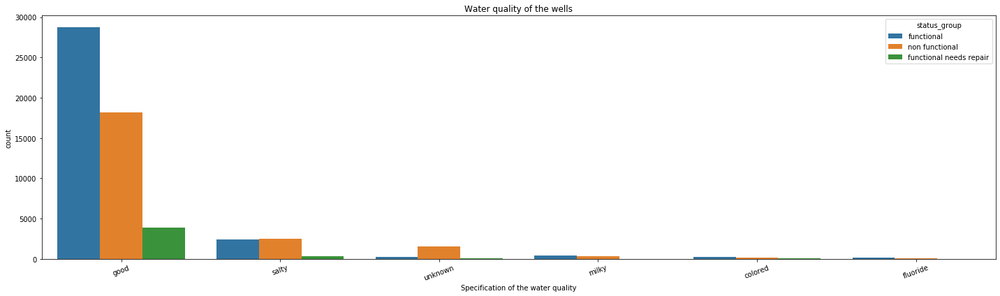

In [146]:
# Plotting of water quality
order = ['good', 'salty', 'unknown', 'milky', 'colored', 'fluoride']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="quality_group", data=df_raw, order=order , hue='status_group')
ax.set_title('Water quality of the wells');
ax.set_xlabel('Specification of the water quality')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

The water with a quality classified as soft is likely to originate froma functional water pump, while if it is salty the propability beeing functional or non functional is equally distributed

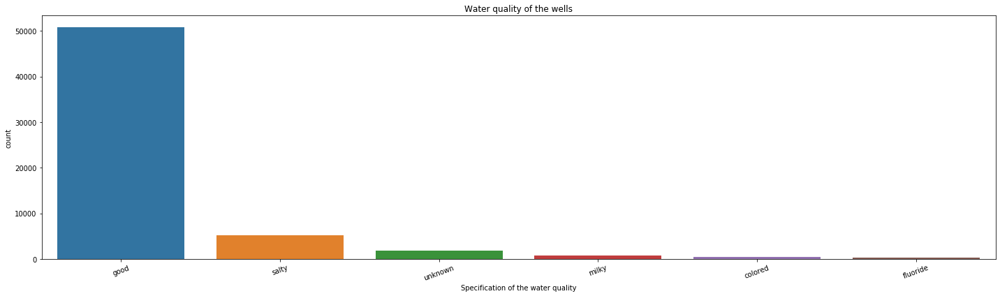

In [147]:
order = ['good', 'salty', 'unknown', 'milky', 'colored', 'fluoride']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="quality_group", data=df_raw, order=order)
ax.set_title('Water quality of the wells');
ax.set_xlabel('Specification of the water quality')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

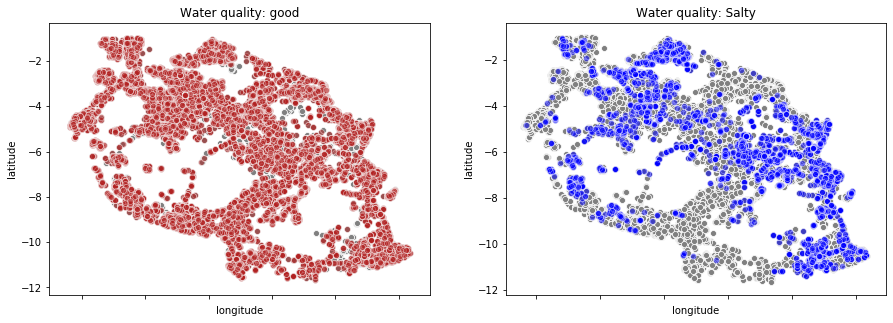

In [148]:
# Plotting on a map
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1= sns.scatterplot(x='longitude',y='latitude',data=df_raw,color='grey', ax=ax1)
ax1= sns.scatterplot(x='longitude',y='latitude',alpha=0.5, data=df_raw[df_raw.quality_group=='good'],color='firebrick',ax=ax1)
ax1.set_title('Water quality: good');
#ax1.set_xlabel('')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=20);

ax2= sns.scatterplot(x='longitude',y='latitude',data=df_raw,color='grey', ax=ax2)
ax2= sns.scatterplot(x='longitude',y='latitude',alpha=0.5, data=df_raw[df_raw.water_quality=='salty'],color='blue',ax=ax2)
ax2.set_title('Water quality: Salty');
#ax2.set_xlabel('')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=20);

The above two features seem to describe incredibly similar information. I'll only retain quality_group in the modeling data set.

In [149]:
drop_feat('water_quality')

### Quantity Features
These features describe the quantity of water provided by the well.

**`quantity`** and **`quantity_group`**

In [150]:
# Value counts quantity
df_raw.quantity.value_counts()

enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: quantity, dtype: int64

In [151]:
# Value counts quantity
df_raw.quantity_group.value_counts()

enough          33186
insufficient    15129
dry              6246
seasonal         4050
unknown           789
Name: quantity_group, dtype: int64

Both features contain the same information therefore the feature quantity_group will be dropped in the next step

In [152]:
# append 'quantity_group' to to_drop-List
drop_feat('quantity_group')

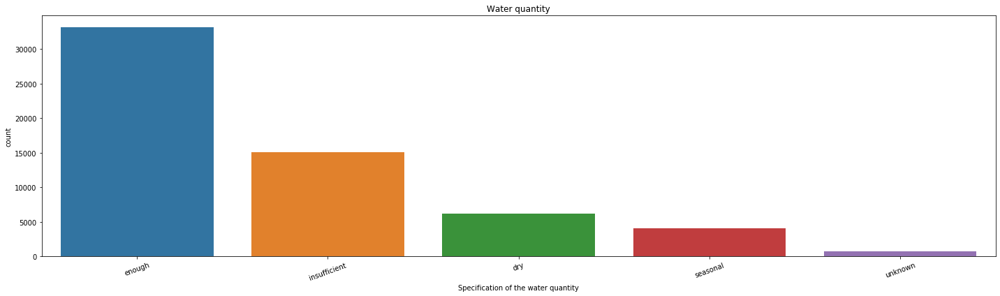

In [153]:
order = ['enough', 'insufficient', 'dry', 'seasonal', 'unknown']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="quantity", data=df_raw, order=order)
ax.set_title('Water quantity');
ax.set_xlabel('Specification of the water quantity')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

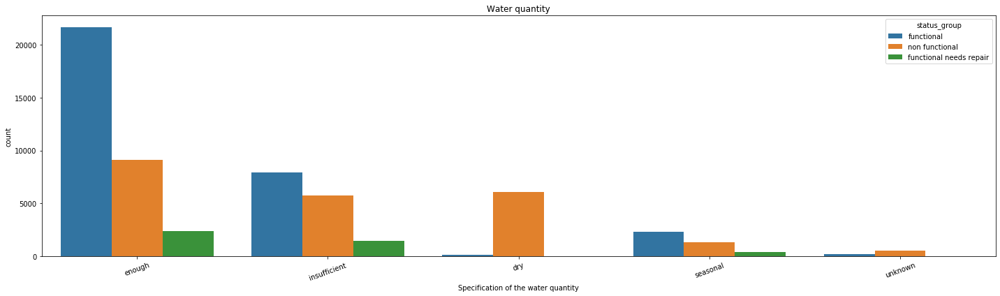

In [154]:
order = ['enough', 'insufficient', 'dry', 'seasonal', 'unknown']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="quantity", data=df_raw, order=order, hue='status_group')
ax.set_title('Water quantity');
ax.set_xlabel('Specification of the water quantity')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

It can be seen obviously that although there are enough water quantity in some wells, they are non-functional. When looking at this graph, dry quantity water points have a highly correlation with non-functionality. If the water point is dry or unknown, there is high chance that water point is non functional. On the other hand, if the quantity is enough, there is a higher chance to find functional water points.

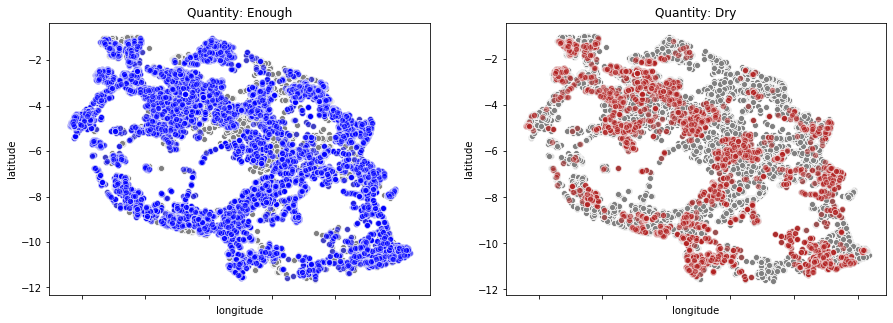

In [155]:
# Plotting on a map (not a nice plot)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1= sns.scatterplot(x='longitude',y='latitude',data=df_raw,color='grey', ax=ax1)
ax1= sns.scatterplot(x='longitude',y='latitude',alpha=0.5, data=df_raw[df_raw.quantity=='enough'],color='blue',ax=ax1)
ax1.set_title('Quantity: Enough');
#ax1.set_xlabel('')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=20);

ax2= sns.scatterplot(x='longitude',y='latitude',data=df_raw,color='grey', ax=ax2)
ax2= sns.scatterplot(x='longitude',y='latitude',alpha=0.5, data=df_raw[df_raw.quantity=='dry'],color='firebrick',ax=ax2)
ax2.set_title('Quantity: Dry');
#ax2.set_xlabel('')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=20);

### Waterpoint type Features

**`waterpoint_type`** and **`waterpoint_type_group`**

In [156]:
# Value counts waterpoint_type
df_raw.waterpoint_type.value_counts()

communal standpipe             28522
hand pump                      17488
other                           6380
communal standpipe multiple     6103
improved spring                  784
cattle trough                    116
dam                                7
Name: waterpoint_type, dtype: int64

In [157]:
# Value counts waterpoint_type_group
df_raw.waterpoint_type_group.value_counts()

communal standpipe    34625
hand pump             17488
other                  6380
improved spring         784
cattle trough           116
dam                       7
Name: waterpoint_type_group, dtype: int64

It can be seen that both features are very similar but the **`waterpoint_type`** feature contains more information thats why **`waterpoint_type_group`** will be dropped

In [158]:
# Replace fluoride abandoned to fluoride 
df_raw['waterpoint_type'] = df_raw['waterpoint_type'].replace(['dam'],'other')

In [159]:
# Dropping waterpoint_type_group
drop_feat('waterpoint_type_group')

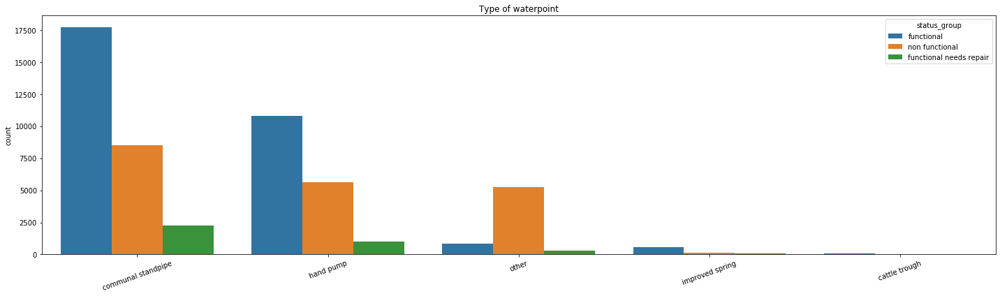

In [160]:
order = ['communal standpipe', 'hand pump', 'other', 'improved spring', 'cattle trough']
fig, ax = plt.subplots(1, 1, figsize=(20,6))
ax = sns.countplot(x="waterpoint_type", data=df_raw, order=order, hue='status_group')
ax.set_title('Type of waterpoint');
ax.set_xlabel('')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

## Boolean Features

Both the **`permit`** and the **`public_meeting`** feature have missing and 0 as Values. Since both features might be relevant for the predictive modelling the entries containing NaN or 0 will be replaced by Unknown

In [161]:
# Value counts of feature permit
df_raw['permit'].value_counts()

True     38852
False    17492
Name: permit, dtype: int64

In [162]:
# Value counts of feature permit
df_raw['public_meeting'].value_counts()

True     51011
False     5055
Name: public_meeting, dtype: int64

In [163]:
# Handle NaN as Unknown
df_raw['permit'].fillna('Unknown',inplace=True)
df_raw['public_meeting'].fillna('Unknown',inplace=True)

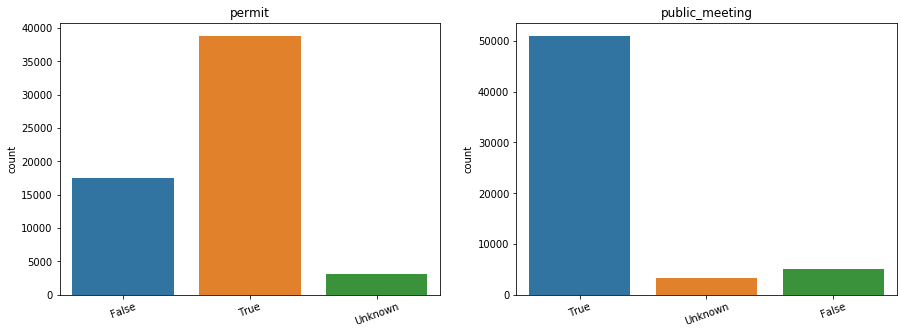

In [164]:
# Plotting the permit and public_meeting Feature
#order=['True','False','Unknown']
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
ax1 = sns.countplot(x="permit", data=df_raw, ax=ax1)
ax1.set_title('permit');
ax1.set_xlabel('')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=20);
#order2=['True','False','Unknown']
ax2 = sns.countplot(x="public_meeting", data=df_raw, ax=ax2)
ax2.set_title('public_meeting');
ax2.set_xlabel('')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=20);

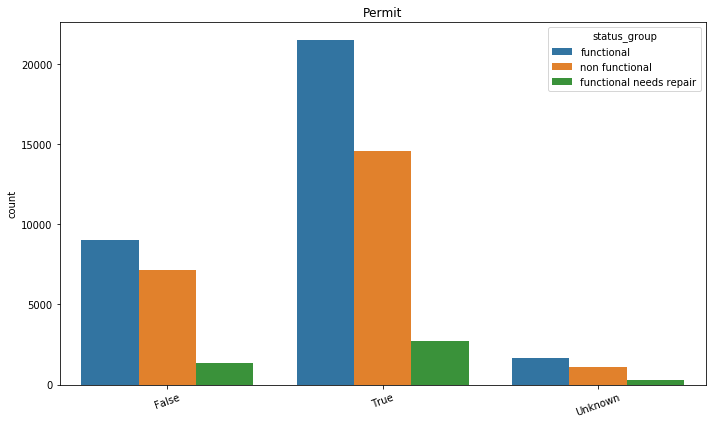

In [165]:
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax = sns.countplot(x="permit", data=df_raw, hue='status_group')
ax.set_title('Permit');
ax.set_xlabel('')
ax.set_xticklabels(ax.get_xticklabels(), rotation=20);
plt.tight_layout() 

# Feature Engineering

## Population Log

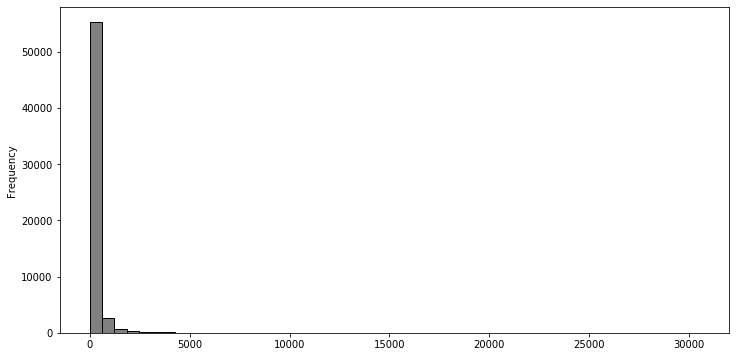

In [166]:
df_raw['population'].plot(kind='hist', bins=50, figsize=(12,6), facecolor='grey',edgecolor='black');

In [167]:
df_raw["population_log"] = [math.log(el) for el in df_raw["population"]]

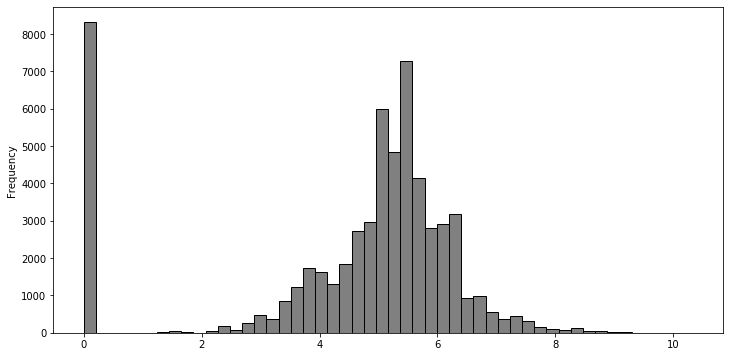

In [168]:
df_raw['population_log'].plot(kind='hist', bins=50, figsize=(12,6), facecolor='grey',edgecolor='black');

In [169]:
drop_feat('population')

## Updating Regions

In [170]:
update_regions(df_raw)

In [171]:
df_raw.region.value_counts()

Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Njombe           3697
Arusha           3350
Kagera           3080
Kigoma           2816
Simiyu           2718
Ruvuma           2640
Pwani            2635
Tanga            2547
Mwanza           2350
Dodoma           2201
Singida          2093
Shinyanga        2014
Mara             1969
Tabora           1959
Mtwara           1730
Iringa           1597
Manyara          1583
Lindi            1546
Geita            1238
Rukwa            1129
Dar es Salaam     805
Katavi            679
Name: region, dtype: int64

In [172]:
# We can see that now only one region is missing
df_raw.region.nunique()

25

# Dropping of Features and Exporting new DataFrame

In [173]:
print('Number of features that will be dropped:', len(to_drop))
print(to_drop)

Number of features that will be dropped: 23
['date_recorded', 'id', 'num_private', 'funder', 'installer', 'wpt_name', 'subvillage', 'ward', 'district_code', 'region_code', 'extraction_type', 'extraction_type_class', 'extraction_type_group', 'management', 'management_group', 'scheme_name', 'source_type', 'source_class', 'payment', 'water_quality', 'quantity_group', 'waterpoint_type_group', 'population']


In [174]:
df_raw.drop(columns=to_drop,inplace=True ) #dropping the columns

In [175]:
df_raw.isna().sum()

amount_tsh           0
gps_height           0
longitude            0
latitude             0
basin                0
region               0
lga                  0
public_meeting       0
recorded_by          0
scheme_management    0
permit               0
construction_year    0
payment_type         0
quality_group        0
quantity             0
source               0
waterpoint_type      0
status_group         0
funder_cat           0
installer_cat        0
extraction_custom    0
management_custom    0
population_log       0
dtype: int64

In [176]:
# Export Data for modelling

In [177]:
df_raw.to_csv(r'data/df_model.csv', index = False)